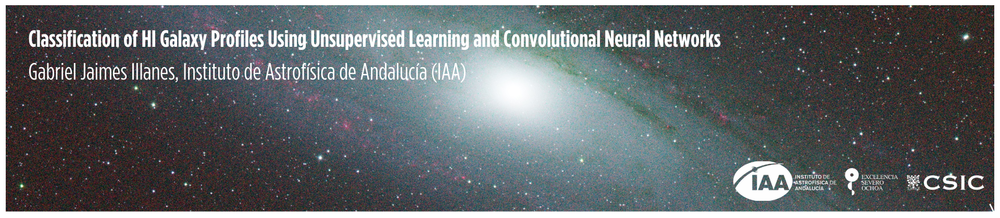

---
<div style="text-align: center;">
    <h2>ASYMMETRY ANALYSIS</h2>
</div>

---

### Step 1: Inspection of Spectrum | CIG - AMIGA

In this part the script processes and visualizes spectral data from a FITS file. It loads the spectrum, normalizes it, and then plots two types of visualizations. The first plot shows the normalized spectrum across all pixels. The second plot displays the spectrum split into right and left halves, with the left halfinverted and negative, and also shows their combined form. The script uses `matplotlib` for plotting and `astropy` for reading FITS files. It is designed to be simple yet effective for analyzing spectral data.


In [ ]:
pip install matplotlib numpy astropy tensorflow scikit-learn pandas tslearn

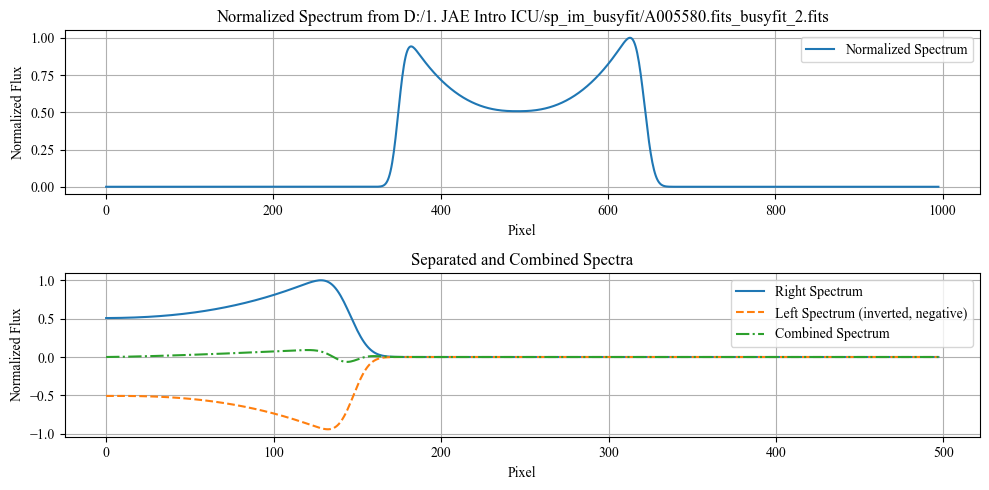

In [2]:
# 1.---------Importation of Libraries------
import matplotlib.pyplot as plt
import numpy as np
from astropy.io import fits

plt.rcParams['font.family'] = 'Times New Roman'

# 2.---------Load and Normalize Spectrum Function------
def plot_spectra(file_path):
    # Load and normalize the spectrum
    spectrum = fits.getdata(file_path)[0]
    spectrum_normalized = (spectrum - spectrum.min()) / (spectrum.max() - spectrum.min())
    
    # Create the x-axis and split the spectrum
    x = np.arange(len(spectrum_normalized))
    center = len(x) // 2
    spectrum_right = spectrum_normalized[center:]
    spectrum_left = -spectrum_normalized[center-1::-1]
    x_right = np.arange(len(spectrum_right))
    
    # Combine right and left spectra
    spectrum_combined = spectrum_right + spectrum_left
    
    # Create the plot
    plt.figure(figsize=(10, 5))
    
    # Plot normalized spectrum
    plt.subplot(2, 1, 1)
    plt.plot(x, spectrum_normalized, label='Normalized Spectrum')
    plt.xlabel('Pixel')
    plt.ylabel('Normalized Flux')
    plt.title(f'Normalized Spectrum from {file_path}')
    plt.grid(True)
    plt.legend()

    # Plot separated and combined spectra
    plt.subplot(2, 1, 2)
    plt.plot(x_right, spectrum_right, label='Right Spectrum')
    plt.plot(np.arange(len(spectrum_left)), spectrum_left, label='Left Spectrum (inverted, negative)', linestyle='--')
    plt.plot(x_right, spectrum_combined, label='Combined Spectrum', linestyle='-.')
    plt.xlabel('Pixel')
    plt.ylabel('Normalized Flux')
    plt.title('Separated and Combined Spectra')
    plt.grid(True)
    plt.legend()
    
    plt.tight_layout()
    plt.show()

# 3.---------File Path and Function Call------
# Path to the FITS file
file_path = 'D:/1. JAE Intro ICU/sp_im_busyfit/A005580.fits_busyfit_2.fits'

# Call the function to plot the spectra
plot_spectra(file_path)


# Step 2: 2D Image Modelling | BusyFit - CIG - AMIGA

---

This code processes a set of FITS files from a specified directory, focusing on files that match a particular naming convention. The code extracts spectral data from each FITS file, normalizes the spectra, and generates ring-like images based on the spectral data. It then creates combined plots that display the original spectrum, its right and left halves, and their combined form. The code saves these plots and ring images as JPEG files and also compiles them into a single PDF document. The entire process is managed by specifying an index range to select which FITS files to process, allowing for flexible analysis of large datasets. Three distinct 2D image models were generated for the symmetry study:

1. The first is a rotation of the fitted spectrum.
2. The second involves rotating the spectrum after subtracting its right and left profiles to accentuate asymmetry features.
3. The third is a normalized version of the previous image, with pixel intensity adjusted to further emphasize specific features (Espada, 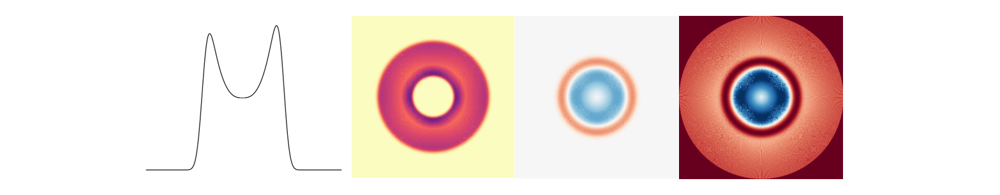1a543.png)
g)
 2011).

Processing file: D:/1. JAE Intro ICU/CIG/ascii-files/sp_busyfit/CIG0004_HG_sb_busyfit_3.fits
Processing file: D:/1. JAE Intro ICU/CIG/ascii-files/sp_busyfit/CIG0008_HG_sb_busyfit_3.fits
Processing file: D:/1. JAE Intro ICU/CIG/ascii-files/sp_busyfit/CIG0009_HG_sb_busyfit_3.fits
Processing file: D:/1. JAE Intro ICU/CIG/ascii-files/sp_busyfit/CIG0011_KLUN_sb_busyfit_3.fits
Processing file: D:/1. JAE Intro ICU/CIG/ascii-files/sp_busyfit/CIG0012_HG_sb_busyfit_3.fits
Processing file: D:/1. JAE Intro ICU/CIG/ascii-files/sp_busyfit/CIG0018_HG84_sb_busyfit_3.fits
Processing file: D:/1. JAE Intro ICU/CIG/ascii-files/sp_busyfit/CIG0023_HG84_sb_busyfit_3.fits
Processing file: D:/1. JAE Intro ICU/CIG/ascii-files/sp_busyfit/CIG0028_GBT_sb_busyfit_3.fits
Processing file: D:/1. JAE Intro ICU/CIG/ascii-files/sp_busyfit/CIG0029_HG_sb_busyfit_3.fits
Processing file: D:/1. JAE Intro ICU/CIG/ascii-files/sp_busyfit/CIG0030_HG_sb_busyfit_3.fits
Processing file: D:/1. JAE Intro ICU/CIG/ascii-files/sp_busyfit

C:\Users\Usuario\AppData\Local\Temp\ipykernel_20904\3918871610.py:193: UserWarning: The figure layout has changed to tight
  fig_spectra.tight_layout()
C:\Users\Usuario\AppData\Local\Temp\ipykernel_20904\3918871610.py:194: UserWarning: The figure layout has changed to tight
  fig_image1.tight_layout()
C:\Users\Usuario\AppData\Local\Temp\ipykernel_20904\3918871610.py:195: UserWarning: The figure layout has changed to tight
  fig_image2.tight_layout()
C:\Users\Usuario\AppData\Local\Temp\ipykernel_20904\3918871610.py:196: UserWarning: The figure layout has changed to tight
  fig_image3.tight_layout()


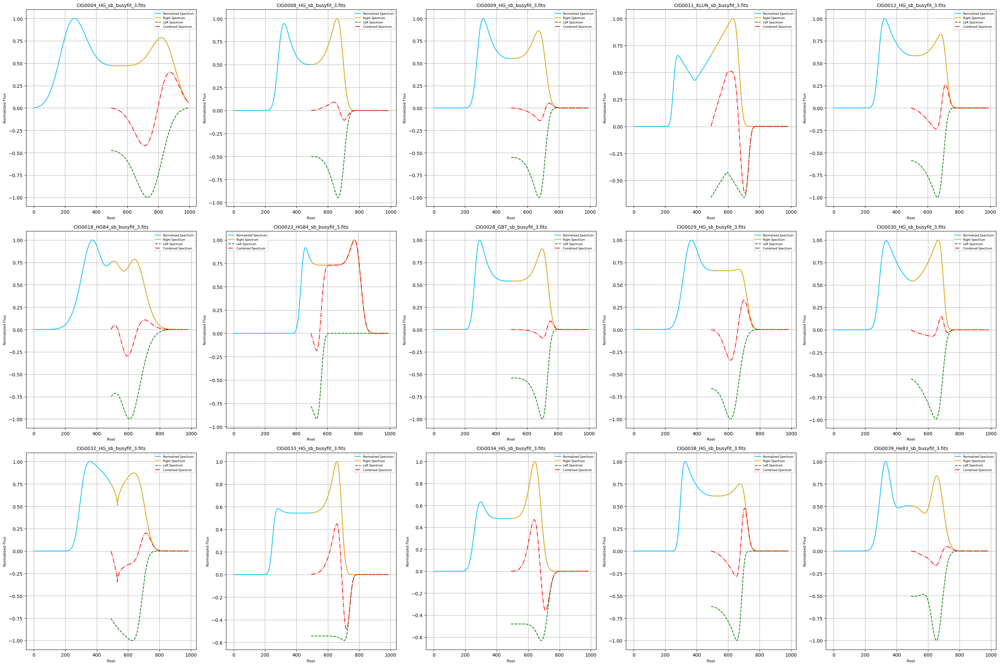

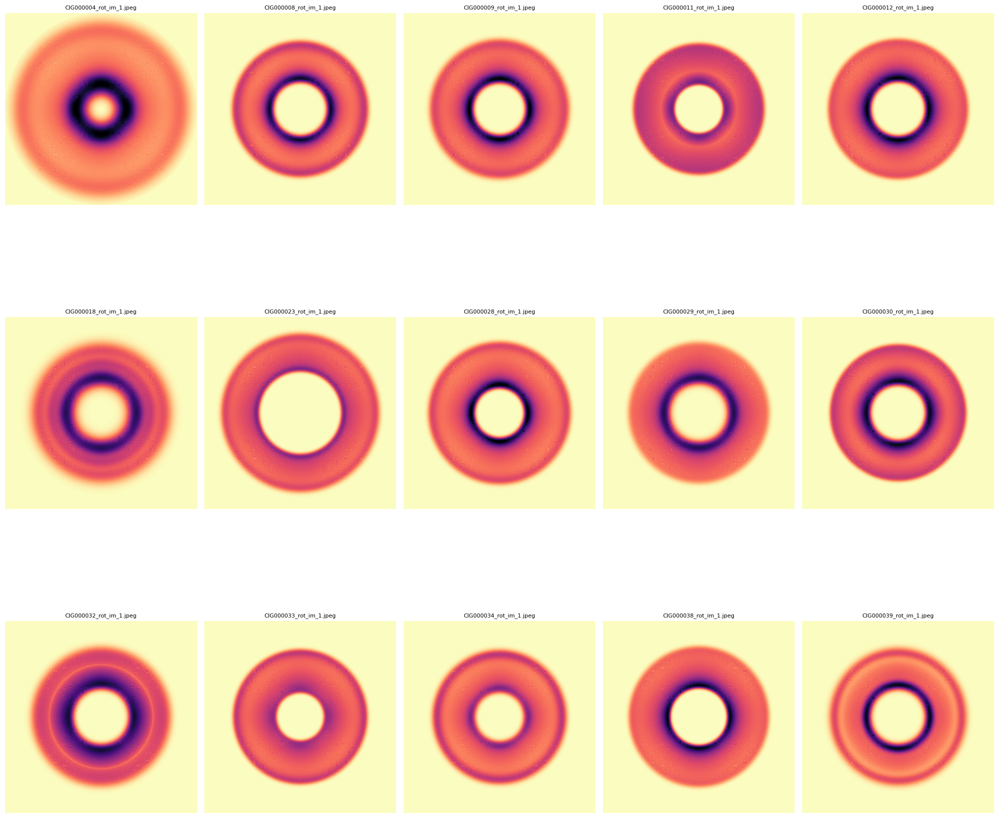

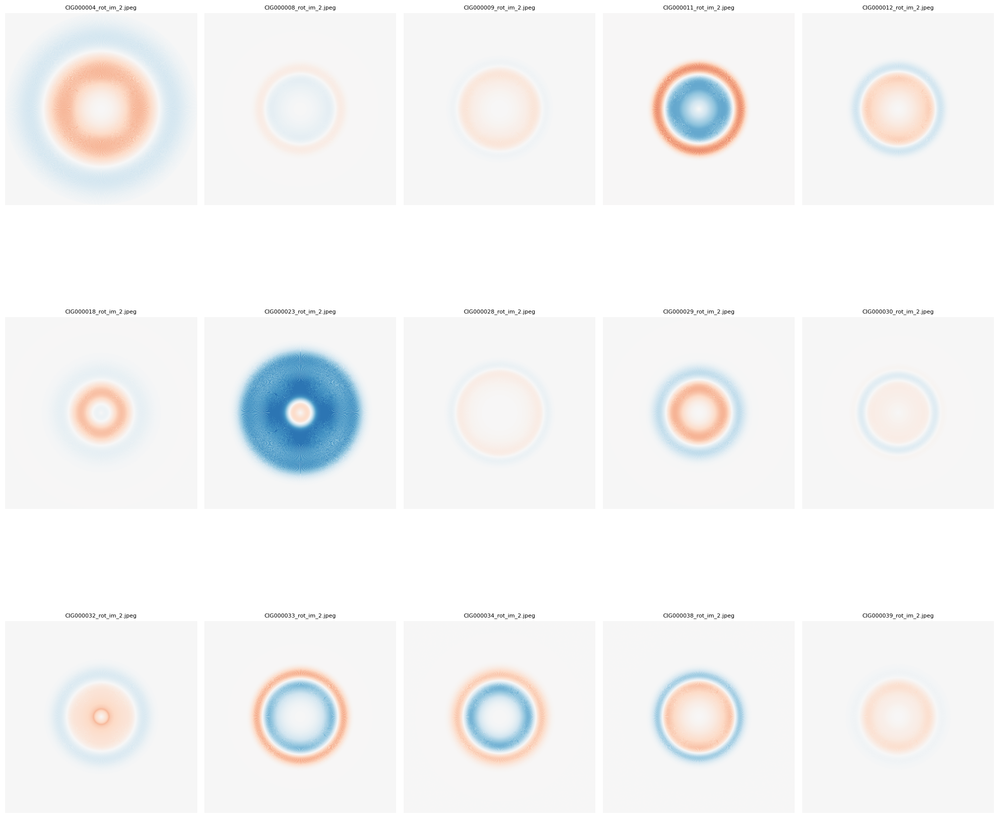

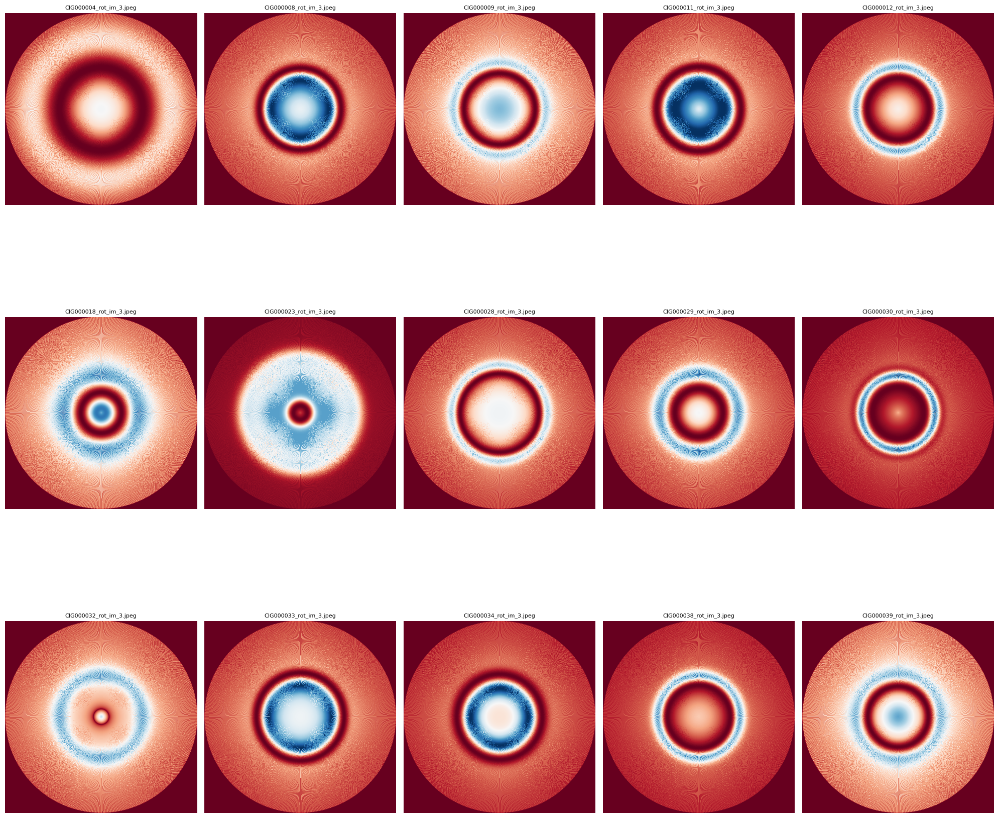

PDF saved at: D:/1. JAE Intro ICU/CIG/ascii-files/sp_busyfit/rot_2D_im\2DImageModel_OutputFigures.pdf


In [1]:
# 1.---------Importation of Libraries------
import os
import re
import matplotlib.pyplot as plt
import numpy as np
from astropy.io import fits
from matplotlib.backends.backend_pdf import PdfPages

# 2.---------Function to Get the List of Files---------
def get_fits_files(directory, file_pattern):
    pattern = re.compile(file_pattern)
    files = []
    for file in os.listdir(directory):
        match = pattern.match(file)
        if match:
            num = int(match.group(1))
            files.append((num, file))
    files.sort()
    return files

# 3.---------Functions to Process FITS Files---------
def load_fits_spectrum(file_path):
    with fits.open(file_path) as hdul:
        data = hdul[0].data
    return data

def normalize_spectrum(spectrum):
    min_val = np.min(spectrum)
    max_val = np.max(spectrum)
    
    # Avoid division by zero
    if max_val - min_val == 0:
        return np.zeros_like(spectrum)  # Return an array of zeros if the spectrum is flat
    else:
        normalized = (spectrum - min_val) / (max_val - min_val)
        return normalized

def create_ring_image_1(ax, spectrum, cmap='magma_r'):
    spectrum_length = len(spectrum)
    image_size = 2 * spectrum_length  # Image size
    image = np.zeros((image_size, image_size))  # Initialize the image
    center = image_size // 2  # Image center

    # Handling negative values in the spectrum
    if np.any(spectrum < 0):
        print("Warning: The spectrum contains negative values. Taking absolute values.")
        spectrum = np.abs(spectrum)  # Option to take absolute values

    # Normalize the spectrum between 0 and 1
    spectrum_min = np.min(spectrum)
    spectrum_range = np.max(spectrum) - spectrum_min
    if spectrum_range > 0:
        normalized_spectrum = (spectrum - spectrum_min) / spectrum_range
    else:
        normalized_spectrum = np.zeros_like(spectrum)

    for r in range(spectrum_length):
        theta = np.linspace(0, 2 * np.pi, image_size)  # Angles from 0 to 360 degrees
        x = center + r * np.cos(theta)  # x coordinates on the circle
        y = center + r * np.sin(theta)  # y coordinates on the circle
        for i in range(len(x)):
            xi = int(round(x[i]))
            yi = int(round(y[i]))
            if 0 <= xi < image_size and 0 <= yi < image_size:
                # Scale the intensity logarithmically for better uniformity
                scaled_intensity = normalized_spectrum[r]
                # Ensure the values are between 0 and 1
                image[yi, xi] = min(scaled_intensity, 1)

    # Normalize the image after value assignment
    image_min = np.min(image)
    image_max = np.max(image)
    if image_max > image_min:
        image = (image - image_min) / (image_max - image_min)

    # Display the image with a continuous colormap
    norm = plt.Normalize(vmin=0, vmax=1)
    ax.imshow(image, cmap='magma_r', norm=norm, origin='lower')
    ax.axis('off')


def create_ring_image_2(ax, spectrum, vmin, vmax, cmap):
    spectrum_length = len(spectrum)
    image_size = 2 * spectrum_length
    image = np.zeros((image_size, image_size))
    center = image_size // 2
    for r in range(spectrum_length):
        theta = np.linspace(0, 2 * np.pi, image_size)  # Corrected line
        x = center + r * np.cos(theta)
        y = center + r * np.sin(theta)
        for i in range(len(x)):
            xi = int(round(x[i]))
            yi = int(round(y[i]))
            image[yi, xi] = spectrum[r]
    norm = plt.Normalize(vmin=vmin, vmax=vmax)
    ax.imshow(image, cmap=cmap, norm=norm, origin='lower')
    ax.axis('off')

def create_ring_image_3(ax, spectrum, cmap):
    # Normalize image 2 to create image 3
    norm = plt.Normalize(vmin=0, vmax=1)
    spectrum_normalized = normalize_spectrum(spectrum)
    create_ring_image_2(ax, spectrum_normalized, vmin=0, vmax=1, cmap=cmap)

def plot_and_save_figures(ax_spectrum, ax_image1, ax_image2, ax_image3, file_path, file_name, cmap, output_dir, num):
    data = load_fits_spectrum(file_path)
    if data.ndim == 2 and data.shape[0] == 1:
        spectrum = data[0]
    else:
        raise ValueError("The FITS file does not contain one-dimensional spectral data.")
    
    spectrum_normalized = normalize_spectrum(spectrum)
    x = np.arange(len(spectrum_normalized))
    center = len(spectrum_normalized) // 2
    spectrum_right = spectrum_normalized[center:]
    x_right = np.arange(center, len(spectrum_normalized))
    spectrum_left = -spectrum_normalized[:center][::-1]
    x_left = np.arange(center, center - len(spectrum_left), -1)
    min_length = min(len(spectrum_right), len(spectrum_left))
    spectrum_right = spectrum_right[:min_length]
    spectrum_left = spectrum_left[:min_length]
    x_right = x_right[:min_length]
    x_left = x_left[:min_length]
    spectrum_combined = spectrum_right + spectrum_left

    ax_spectrum.plot(x, spectrum_normalized, label='Normalized Spectrum', color='deepskyblue')
    ax_spectrum.plot(x_right, spectrum_right, label='Right Spectrum', color='orange')
    ax_spectrum.plot(x_right, spectrum_left, label='Left Spectrum', linestyle='--', color='green')
    ax_spectrum.plot(x_right, spectrum_combined, label='Combined Spectrum', linestyle='-.', color='red')
    ax_spectrum.set_title(file_name, fontsize=10)
    ax_spectrum.set_xlabel('Pixel', fontsize=8)
    ax_spectrum.set_ylabel('Normalized Flux', fontsize=8)
    ax_spectrum.legend(fontsize=6)
    ax_spectrum.grid(True)

    create_ring_image_1(ax_image1, spectrum_normalized, cmap=cmap)
    create_ring_image_2(ax_image2, spectrum_combined, vmin=-1, vmax=1, cmap=cmap)
    create_ring_image_3(ax_image3, spectrum_combined, cmap=cmap)

    if not os.path.exists(output_dir):
        os.makedirs(output_dir)
    
    num_str = f'{num:06}'

    fig1, ax1 = plt.subplots()
    ax1.imshow(ax_image1.images[0].get_array(), cmap='magma_r', vmin=0, vmax=1, origin='lower')
    ax1.axis('off')
    fig1.savefig(os.path.join(output_dir, f'CIG{num_str}_rot_im_1.jpeg'), bbox_inches='tight', pad_inches=0)
    plt.close(fig1)
    
    fig2, ax2 = plt.subplots()
    ax2.imshow(ax_image2.images[0].get_array(), cmap=cmap, vmin=-1, vmax=1, origin='lower')
    ax2.axis('off')
    fig2.savefig(os.path.join(output_dir, f'CIG{num_str}_rot_im_2.jpeg'), bbox_inches='tight', pad_inches=0)
    plt.close(fig2)
    
    fig3, ax3 = plt.subplots()
    ax3.imshow(ax_image3.images[0].get_array(), cmap=cmap, vmin=0, vmax=1, origin='lower')
    ax3.axis('off')
    fig3.savefig(os.path.join(output_dir, f'CIG{num_str}_rot_im_3.jpeg'), bbox_inches='tight', pad_inches=0)
    plt.close(fig3)

def main(directory, output_dir, start_index, end_index, file_pattern, cmap, pdf_path):
    fits_files = get_fits_files(directory, file_pattern)
    fits_files = [file for file in fits_files if start_index <= file[0] <= end_index]
    num_files_to_process = len(fits_files)

    if num_files_to_process == 0:
        print("No FITS files found within the specified index range.")
        return

    num_rows = (num_files_to_process + 4) // 5
    num_cols = 5

    fig_spectra, axes_spectra = plt.subplots(num_rows, num_cols, figsize=(30, 20), constrained_layout=True)
    fig_image1, axes_image1 = plt.subplots(num_rows, num_cols, figsize=(20, 20), constrained_layout=True)
    fig_image2, axes_image2 = plt.subplots(num_rows, num_cols, figsize=(20, 20), constrained_layout=True)
    fig_image3, axes_image3 = plt.subplots(num_rows, num_cols, figsize=(20, 20), constrained_layout=True)

    for i, (num, file_name) in enumerate(fits_files):
        file_path = os.path.join(directory, file_name)
        print(f"Processing file: {file_path}")
        
        row = i // num_cols
        col = i % num_cols
        
        plot_and_save_figures(axes_spectra[row, col], axes_image1[row, col], axes_image2[row, col], axes_image3[row, col], file_path, file_name, cmap, output_dir, num)
        
        axes_image1[row, col].set_title(f'CIG{num:06}_rot_im_1.jpeg', fontsize=8)
        axes_image2[row, col].set_title(f'CIG{num:06}_rot_im_2.jpeg', fontsize=8)
        axes_image3[row, col].set_title(f'CIG{num:06}_rot_im_3.jpeg', fontsize=8)

    fig_spectra.tight_layout()
    fig_image1.tight_layout()
    fig_image2.tight_layout()
    fig_image3.tight_layout()

    with PdfPages(pdf_path) as pdf_pages:
        pdf_pages.savefig(fig_spectra)
        pdf_pages.savefig(fig_image1)
        pdf_pages.savefig(fig_image2)
        pdf_pages.savefig(fig_image3)

    plt.show()

    print(f"PDF saved at: {pdf_path}")

# 4.---------Input Parameters---------
directory = 'D:/1. JAE Intro ICU/CIG/ascii-files/sp_busyfit/'
output_dir = 'D:/1. JAE Intro ICU/CIG/ascii-files/sp_busyfit/rot_2D_im'
start_index = 0
end_index = 39  #Not listed, rather the actual CIG Naming of Object (Ex: CIG0009_HG_sb_busyfit_3.fits)
file_pattern = r'CIG(\d+)_.*_busyfit_3\.fits'
cmap = 'RdBu'
pdf_path = os.path.join(output_dir, '2DImageModel_OutputFigures.pdf')

# Run the main function with the specified parameters
main(directory, output_dir, start_index, end_index, file_pattern, cmap, pdf_path)


---

### Step 3: Asymmetry Classificatio- 2D Models n | CIG - AMIGA

---

We present a Python script designed for image classification tasks using convolutional neural networks (CNNs). It processes images from a specified directory, builds a CNN model, and tunes hyperparameters (like test size, random state, and epochs) to find the best configuration. The script also includes steps for data visualization, success rate calculation, and model performance evaluation. The results, including classification success rates and visualizations, are saved in a specified results directory. The script is highly configurable, with key variables set at the beginning for easy adaptation to different datasets and scenarios.

The processing consists of the following steps:

1. The hyperparameter configurations for:

   - `num_groups == '2'` or `'3'`
   - `test_size_options = [0.7, 0.5, 0.3]`
   - `random_state_options = [42, 99]`
   - `epochs_options = [50, 80, 120]`
   - `model_configs = [ [32, 64, 128], [32, 64, 128, 256], [32, 64, 128, 256, 512] ]`

   Therefore, the total number of iterations are:

   \[
   3 \, (\text{test sizes}) \times 2 \, (\text{random states}) \times 3 \, (\text{epochs}) \times 3 \, (\text{model configs}) = 54 \, \text{combinations}
   \]

2. As the classification develops clustering, without assigning specific labels such as *"0" symmetric*, *"1" slightly asymmetric*, *"2" strongly asymmetric*, we make a "transformation" of all classifications made by reassigning labels corresponding to the number of groups:

   ```python
   if num_groups == 2:
       transformations = {
           'Class_y_v1': lambda x: x,
           'Class_y_v2': lambda x: x.map({0: 1, 1: 0}),
       }
   elif num_groups == 3:
       transformations = {
           'Class_y_v1': lambda x: x,
           'Class_y_v2': lambda x: x.map({0: 1, 1: 2, 2: 0}),
           'Class_y_v3': lambda x: x.map({0: 2, 1: 0, 2: 1}),
           'Class_y_v4': lambda x: x.map({0: 0, 1: 2, 2: 1}),
           'Class_y_v5': lambda x: x.map({0: 1, 1: 0, 2: 2}),
           'Class_y_vd     x: x.map({0: 2, 1: 1, 2: 0})
       }

```Class_y_v6': lam```

3. The products of the code are:
    
With the key name lab- el `classification_results_{model_configs- }_te}{si`.o A .cshepochs}_rs{random_stat
atio` ``

A  `.v` file for each classificaon  
B. A ``
csv` file with the transformation of labels  
C. A `success_rate_across_configurations.jpeg` plot comparing the current transformations with the previous D. Espada (2010) CIG classification, in the form of a *Success Rate* that calculates the number of, 1: 1, 2: 0})
    }
     else:
4. c
ex model



Epoch 1/50


C:\Users\Usuario\anaconda3\Lib\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 4s 461ms/step - accuracy: 0.5023 - loss: 1.8731 - val_accuracy: 0.5095 - val_loss: 0.6971
Epoch 2/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 355ms/step - accuracy: 0.5724 - loss: 1.3644 - val_accuracy: 0.5048 - val_loss: 0.7219
Epoch 3/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 360ms/step - accuracy: 0.7049 - loss: 0.8101 - val_accuracy: 0.5048 - val_loss: 0.7692
Epoch 4/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 353ms/step - accuracy: 0.7378 - loss: 0.6793 - val_accuracy: 0.4714 - val_loss: 0.7004
Epoch 5/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 369ms/step - accuracy: 0.6592 - loss: 1.0850 - val_accuracy: 0.4952 - val_loss: 0.8215
Epoch 6/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 373ms/step - accuracy: 0.6804 - loss: 0.7578 - val_accuracy: 0.4952 - val_loss: 1.1319
Epoch 7/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 382ms/step - accuracy: 0.8007 - loss: 0.4910 - val_accuracy: 0.4952 - val_loss: 1.7143
Epoch 8/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 396ms/step - accuracy: 0.7010 - loss: 0.6030 - val_accuracy: 0.4952 - val_loss: 2.6394
Epo

C:\Users\Usuario\anaconda3\Lib\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 5s 483ms/step - accuracy: 0.5502 - loss: 2.7735 - val_accuracy: 0.4952 - val_loss: 0.7061
Epoch 2/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 365ms/step - accuracy: 0.5753 - loss: 1.7703 - val_accuracy: 0.4952 - val_loss: 0.7170
Epoch 3/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 377ms/step - accuracy: 0.6425 - loss: 0.9330 - val_accuracy: 0.4952 - val_loss: 0.9069
Epoch 4/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 358ms/step - accuracy: 0.6510 - loss: 0.8253 - val_accuracy: 0.4952 - val_loss: 1.3356
Epoch 5/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 367ms/step - accuracy: 0.5835 - loss: 0.9760 - val_accuracy: 0.4952 - val_loss: 1.2760
Epoch 6/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 342ms/step - accuracy: 0.7684 - loss: 0.6324 - val_accuracy: 0.4952 - val_loss: 0.9564
Epoch 7/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 354ms/step - accuracy: 0.6308 - loss: 0.8646 - val_accuracy: 0.4952 - val_loss: 0.9099
Epoch 8/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 356ms/step - accuracy: 0.6676 - loss: 0.6609 - val_accuracy: 0.4952 - val_loss: 1.2854
Epo

C:\Users\Usuario\anaconda3\Lib\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 6s 466ms/step - accuracy: 0.4348 - loss: 1.3538 - val_accuracy: 0.5238 - val_loss: 0.6931
Epoch 2/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 349ms/step - accuracy: 0.5629 - loss: 1.0051 - val_accuracy: 0.5048 - val_loss: 0.6939
Epoch 3/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 343ms/step - accuracy: 0.6754 - loss: 1.0499 - val_accuracy: 0.5048 - val_loss: 0.6945
Epoch 4/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 358ms/step - accuracy: 0.6398 - loss: 0.8723 - val_accuracy: 0.5048 - val_loss: 0.7075
Epoch 5/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 347ms/step - accuracy: 0.4994 - loss: 1.2950 - val_accuracy: 0.4952 - val_loss: 0.6991
Epoch 6/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 389ms/step - accuracy: 0.6820 - loss: 0.7922 - val_accuracy: 0.4952 - val_loss: 1.1218
Epoch 7/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 371ms/step - accuracy: 0.5796 - loss: 0.9900 - val_accuracy: 0.4952 - val_loss: 1.0239
Epoch 8/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 385ms/step - accuracy: 0.6331 - loss: 0.8497 - val_accuracy: 0.4952 - val_loss:

C:\Users\Usuario\anaconda3\Lib\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 4s 469ms/step - accuracy: 0.4126 - loss: 2.2058 - val_accuracy: 0.5048 - val_loss: 1.5973
Epoch 2/80
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 360ms/step - accuracy: 0.6109 - loss: 0.9909 - val_accuracy: 0.5048 - val_loss: 1.8980
Epoch 3/80
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 355ms/step - accuracy: 0.6670 - loss: 0.9442 - val_accuracy: 0.5048 - val_loss: 1.1878
Epoch 4/80
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 352ms/step - accuracy: 0.5640 - loss: 0.8714 - val_accuracy: 0.5048 - val_loss: 0.7559
Epoch 5/80
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 360ms/step - accuracy: 0.6637 - loss: 0.7741 - val_accuracy: 0.5048 - val_loss: 0.7425
Epoch 6/80
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 357ms/step - accuracy: 0.7049 - loss: 0.6699 - val_accuracy: 0.5048 - val_loss: 0.7904
Epoch 7/80
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 359ms/step - accuracy: 0.7828 - loss: 0.5477 - val_accuracy: 0.5000 - val_loss: 0.7579
Epoch 8/80
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 354ms/step - accuracy: 0.7501 - loss: 0.5131 - val_accuracy: 0.4762 - val_loss: 0.7221
Epo

C:\Users\Usuario\anaconda3\Lib\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 5s 501ms/step - accuracy: 0.4410 - loss: 2.0360 - val_accuracy: 0.5048 - val_loss: 0.7039
Epoch 2/80
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 374ms/step - accuracy: 0.6292 - loss: 1.5245 - val_accuracy: 0.5048 - val_loss: 0.6947
Epoch 3/80
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 365ms/step - accuracy: 0.5740 - loss: 0.9953 - val_accuracy: 0.5048 - val_loss: 0.6962
Epoch 4/80
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 353ms/step - accuracy: 0.6966 - loss: 0.6924 - val_accuracy: 0.5048 - val_loss: 0.7063
Epoch 5/80
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 356ms/step - accuracy: 0.7016 - loss: 0.7414 - val_accuracy: 0.4810 - val_loss: 0.6979
Epoch 6/80
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 352ms/step - accuracy: 0.7055 - loss: 0.8001 - val_accuracy: 0.4905 - val_loss: 0.6996
Epoch 7/80
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 365ms/step - accuracy: 0.5952 - loss: 0.9542 - val_accuracy: 0.4857 - val_loss: 0.6986
Epoch 8/80
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 348ms/step - accuracy: 0.6559 - loss: 0.7576 - val_accuracy: 0.4905 - val_loss: 0.7050
Epo

C:\Users\Usuario\anaconda3\Lib\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/80
3/3 ━━━━━━━━━━━━━━━━━━━━ 6s 496ms/step - accuracy: 0.4628 - loss: 1.7280 - val_accuracy: 0.4952 - val_loss: 0.6972
Epoch 2/80
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 374ms/step - accuracy: 0.5206 - loss: 1.6415 - val_accuracy: 0.4952 - val_loss: 0.6950
Epoch 3/80
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 368ms/step - accuracy: 0.5535 - loss: 1.1979 - val_accuracy: 0.4952 - val_loss: 0.7042
Epoch 4/80
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 360ms/step - accuracy: 0.5629 - loss: 1.1070 - val_accuracy: 0.5048 - val_loss: 0.6946
Epoch 5/80
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 366ms/step - accuracy: 0.6109 - loss: 1.2415 - val_accuracy: 0.4952 - val_loss: 0.7161
Epoch 6/80
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 359ms/step - accuracy: 0.5985 - loss: 0.9592 - val_accuracy: 0.4952 - val_loss: 1.0795
Epoch 7/80
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 367ms/step - accuracy: 0.5601 - loss: 1.0976 - val_accuracy: 0.4952 - val_loss: 1.4222
Epoch 8/80
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 361ms/step - accuracy: 0.7071 - loss: 0.9883 - val_accuracy: 0.4952 - val_loss:

C:\Users\Usuario\anaconda3\Lib\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 5s 474ms/step - accuracy: 0.4994 - loss: 1.6519 - val_accuracy: 0.5048 - val_loss: 0.7649
Epoch 2/120
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 368ms/step - accuracy: 0.5880 - loss: 1.2596 - val_accuracy: 0.5048 - val_loss: 0.7087
Epoch 3/120
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 369ms/step - accuracy: 0.5952 - loss: 1.0421 - val_accuracy: 0.5048 - val_loss: 0.7138
Epoch 4/120
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 372ms/step - accuracy: 0.6063 - loss: 0.9310 - val_accuracy: 0.4952 - val_loss: 0.7698
Epoch 5/120
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 375ms/step - accuracy: 0.6742 - loss: 0.7894 - val_accuracy: 0.4952 - val_loss: 0.8106
Epoch 6/120
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 378ms/step - accuracy: 0.6938 - loss: 0.6615 - val_accuracy: 0.4952 - val_loss: 0.9618
Epoch 7/120
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 367ms/step - accuracy: 0.7283 - loss: 0.5450 - val_accuracy: 0.4952 - val_loss: 1.2869
Epoch 8/120
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 367ms/step - accuracy: 0.7182 - loss: 0.6548 - val_accuracy: 0.4952 - val_loss: 1.5

C:\Users\Usuario\anaconda3\Lib\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 5s 467ms/step - accuracy: 0.5156 - loss: 1.9343 - val_accuracy: 0.5048 - val_loss: 0.6964
Epoch 2/120
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 354ms/step - accuracy: 0.5411 - loss: 1.5040 - val_accuracy: 0.5048 - val_loss: 0.6978
Epoch 3/120
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 356ms/step - accuracy: 0.6331 - loss: 0.8509 - val_accuracy: 0.4952 - val_loss: 0.7102
Epoch 4/120
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 360ms/step - accuracy: 0.5891 - loss: 1.0294 - val_accuracy: 0.4952 - val_loss: 0.9376
Epoch 5/120
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 367ms/step - accuracy: 0.6331 - loss: 0.7586 - val_accuracy: 0.4952 - val_loss: 1.4387
Epoch 6/120
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 360ms/step - accuracy: 0.5695 - loss: 0.9791 - val_accuracy: 0.4952 - val_loss: 1.9314
Epoch 7/120
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 363ms/step - accuracy: 0.6983 - loss: 0.6556 - val_accuracy: 0.4952 - val_loss: 2.4156
Epoch 8/120
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 356ms/step - accuracy: 0.7061 - loss: 0.7029 - val_accuracy: 0.4952 - val_loss: 3.0

C:\Users\Usuario\anaconda3\Lib\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/120
3/3 ━━━━━━━━━━━━━━━━━━━━ 6s 510ms/step - accuracy: 0.5084 - loss: 1.4754 - val_accuracy: 0.4952 - val_loss: 0.7018
Epoch 2/120
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 379ms/step - accuracy: 0.4994 - loss: 1.3369 - val_accuracy: 0.4952 - val_loss: 0.7159
Epoch 3/120
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 361ms/step - accuracy: 0.5156 - loss: 1.0150 - val_accuracy: 0.4952 - val_loss: 0.7429
Epoch 4/120
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 366ms/step - accuracy: 0.6364 - loss: 1.0027 - val_accuracy: 0.4952 - val_loss: 0.8574
Epoch 5/120
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 372ms/step - accuracy: 0.5673 - loss: 0.9274 - val_accuracy: 0.4952 - val_loss: 0.8670
Epoch 6/120
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 369ms/step - accuracy: 0.6938 - loss: 0.7265 - val_accuracy: 0.4952 - val_loss: 0.7408
Epoch 7/120
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 357ms/step - accuracy: 0.6152 - loss: 0.9910 - val_accuracy: 0.4952 - val_loss: 0.7950
Epoch 8/120
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 354ms/step - accuracy: 0.5802 - loss: 1.0434 - val_accuracy: 0.4952 - v

C:\Users\Usuario\anaconda3\Lib\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 4s 472ms/step - accuracy: 0.3959 - loss: 1.8078 - val_accuracy: 0.4810 - val_loss: 0.7809
Epoch 2/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 362ms/step - accuracy: 0.4922 - loss: 1.4747 - val_accuracy: 0.4810 - val_loss: 0.7694
Epoch 3/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 370ms/step - accuracy: 0.6849 - loss: 0.6869 - val_accuracy: 0.4810 - val_loss: 0.7587
Epoch 4/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 363ms/step - accuracy: 0.7149 - loss: 0.6695 - val_accuracy: 0.4810 - val_loss: 0.8752
Epoch 5/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 372ms/step - accuracy: 0.6709 - loss: 0.7205 - val_accuracy: 0.4810 - val_loss: 0.7666
Epoch 6/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 366ms/step - accuracy: 0.7723 - loss: 0.4549 - val_accuracy: 0.4952 - val_loss: 0.6956
Epoch 7/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 366ms/step - accuracy: 0.6732 - loss: 0.6566 - val_accuracy: 0.5190 - val_loss: 0.7130
Epoch 8/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 364ms/step - accuracy: 0.7433 - loss: 0.6105 - val_accuracy: 0.5238 - val_loss: 0.6994
Epo

C:\Users\Usuario\anaconda3\Lib\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 5s 475ms/step - accuracy: 0.5919 - loss: 1.2379 - val_accuracy: 0.4810 - val_loss: 0.7117
Epoch 2/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 354ms/step - accuracy: 0.5374 - loss: 1.1552 - val_accuracy: 0.4810 - val_loss: 0.7011
Epoch 3/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 362ms/step - accuracy: 0.5662 - loss: 0.9671 - val_accuracy: 0.5190 - val_loss: 0.7570
Epoch 4/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 353ms/step - accuracy: 0.5907 - loss: 1.2428 - val_accuracy: 0.5190 - val_loss: 1.0389
Epoch 5/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 361ms/step - accuracy: 0.7523 - loss: 0.5741 - val_accuracy: 0.5190 - val_loss: 1.3437
Epoch 6/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 371ms/step - accuracy: 0.5940 - loss: 0.7738 - val_accuracy: 0.5190 - val_loss: 1.7422
Epoch 7/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 354ms/step - accuracy: 0.7221 - loss: 0.7745 - val_accuracy: 0.5190 - val_loss: 2.4749
Epoch 8/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 373ms/step - accuracy: 0.7088 - loss: 0.6907 - val_accuracy: 0.5190 - val_loss: 3.0292
Epo

C:\Users\Usuario\anaconda3\Lib\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 6s 495ms/step - accuracy: 0.5674 - loss: 1.2038 - val_accuracy: 0.5190 - val_loss: 0.6925
Epoch 2/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 383ms/step - accuracy: 0.5027 - loss: 1.8191 - val_accuracy: 0.4810 - val_loss: 0.6994
Epoch 3/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 364ms/step - accuracy: 0.6158 - loss: 1.0710 - val_accuracy: 0.5190 - val_loss: 0.6948
Epoch 4/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 363ms/step - accuracy: 0.6849 - loss: 0.8170 - val_accuracy: 0.5190 - val_loss: 0.7094
Epoch 5/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 357ms/step - accuracy: 0.5864 - loss: 0.8402 - val_accuracy: 0.5190 - val_loss: 0.7340
Epoch 6/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 357ms/step - accuracy: 0.5740 - loss: 1.0631 - val_accuracy: 0.5190 - val_loss: 0.8473
Epoch 7/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 375ms/step - accuracy: 0.6409 - loss: 0.8272 - val_accuracy: 0.5190 - val_loss: 0.7609
Epoch 8/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 368ms/step - accuracy: 0.5557 - loss: 1.0686 - val_accuracy: 0.5190 - val_loss:

C:\Users\Usuario\anaconda3\Lib\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 5s 503ms/step - accuracy: 0.4722 - loss: 1.9988 - val_accuracy: 0.5286 - val_loss: 0.6994
Epoch 2/80
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 384ms/step - accuracy: 0.7166 - loss: 0.6919 - val_accuracy: 0.5000 - val_loss: 0.6931
Epoch 3/80
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 383ms/step - accuracy: 0.5852 - loss: 0.9439 - val_accuracy: 0.4810 - val_loss: 0.7857
Epoch 4/80
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 409ms/step - accuracy: 0.7439 - loss: 0.5806 - val_accuracy: 0.4857 - val_loss: 0.7412
Epoch 5/80
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 391ms/step - accuracy: 0.6921 - loss: 0.6806 - val_accuracy: 0.4714 - val_loss: 0.7074
Epoch 6/80
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 365ms/step - accuracy: 0.6604 - loss: 0.6337 - val_accuracy: 0.5190 - val_loss: 0.7012
Epoch 7/80
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 411ms/step - accuracy: 0.7394 - loss: 0.6179 - val_accuracy: 0.5190 - val_loss: 0.7107
Epoch 8/80
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 377ms/step - accuracy: 0.6944 - loss: 0.6508 - val_accuracy: 0.5190 - val_loss: 0.7661
Epo

C:\Users\Usuario\anaconda3\Lib\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 5s 480ms/step - accuracy: 0.4716 - loss: 2.5148 - val_accuracy: 0.4810 - val_loss: 0.7094
Epoch 2/80
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 360ms/step - accuracy: 0.6232 - loss: 1.5314 - val_accuracy: 0.4810 - val_loss: 0.7009
Epoch 3/80
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 378ms/step - accuracy: 0.5769 - loss: 0.8836 - val_accuracy: 0.4810 - val_loss: 0.7431
Epoch 4/80
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 369ms/step - accuracy: 0.6370 - loss: 0.8998 - val_accuracy: 0.4810 - val_loss: 0.7523
Epoch 5/80
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 364ms/step - accuracy: 0.5623 - loss: 0.8598 - val_accuracy: 0.4810 - val_loss: 0.7164
Epoch 6/80
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 360ms/step - accuracy: 0.6197 - loss: 0.7609 - val_accuracy: 0.4857 - val_loss: 0.7000
Epoch 7/80
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 359ms/step - accuracy: 0.6954 - loss: 0.6716 - val_accuracy: 0.5190 - val_loss: 0.6944
Epoch 8/80
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 363ms/step - accuracy: 0.7534 - loss: 0.5716 - val_accuracy: 0.5190 - val_loss: 0.7080
Epo

C:\Users\Usuario\anaconda3\Lib\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/80
3/3 ━━━━━━━━━━━━━━━━━━━━ 6s 496ms/step - accuracy: 0.4961 - loss: 1.5848 - val_accuracy: 0.5190 - val_loss: 0.6926
Epoch 2/80
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 366ms/step - accuracy: 0.5362 - loss: 1.7939 - val_accuracy: 0.5190 - val_loss: 0.6949
Epoch 3/80
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 366ms/step - accuracy: 0.5535 - loss: 1.1458 - val_accuracy: 0.5190 - val_loss: 0.6972
Epoch 4/80
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 375ms/step - accuracy: 0.4988 - loss: 1.2794 - val_accuracy: 0.5190 - val_loss: 0.7700
Epoch 5/80
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 369ms/step - accuracy: 0.5411 - loss: 1.2374 - val_accuracy: 0.5190 - val_loss: 0.8315
Epoch 6/80
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 379ms/step - accuracy: 0.5434 - loss: 1.1849 - val_accuracy: 0.5190 - val_loss: 0.7609
Epoch 7/80
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 389ms/step - accuracy: 0.7456 - loss: 0.7308 - val_accuracy: 0.5190 - val_loss: 0.7985
Epoch 8/80
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 363ms/step - accuracy: 0.6086 - loss: 0.9594 - val_accuracy: 0.5190 - val_loss:

C:\Users\Usuario\anaconda3\Lib\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 4s 486ms/step - accuracy: 0.5206 - loss: 1.8890 - val_accuracy: 0.5095 - val_loss: 0.6953
Epoch 2/120
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 377ms/step - accuracy: 0.5685 - loss: 1.0361 - val_accuracy: 0.4810 - val_loss: 0.7908
Epoch 3/120
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 371ms/step - accuracy: 0.5907 - loss: 0.9780 - val_accuracy: 0.4810 - val_loss: 0.7669
Epoch 4/120
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 372ms/step - accuracy: 0.7211 - loss: 0.8055 - val_accuracy: 0.4762 - val_loss: 0.7018
Epoch 5/120
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 377ms/step - accuracy: 0.6865 - loss: 0.7590 - val_accuracy: 0.5190 - val_loss: 0.7056
Epoch 6/120
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 380ms/step - accuracy: 0.6592 - loss: 0.8855 - val_accuracy: 0.5190 - val_loss: 0.7585
Epoch 7/120
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 374ms/step - accuracy: 0.7094 - loss: 0.6218 - val_accuracy: 0.5190 - val_loss: 0.7473
Epoch 8/120
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 387ms/step - accuracy: 0.7734 - loss: 0.5994 - val_accuracy: 0.5190 - val_loss: 0.7

C:\Users\Usuario\anaconda3\Lib\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 5s 479ms/step - accuracy: 0.4181 - loss: 1.6016 - val_accuracy: 0.4810 - val_loss: 0.7558
Epoch 2/120
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 382ms/step - accuracy: 0.6292 - loss: 0.9801 - val_accuracy: 0.4810 - val_loss: 0.7007
Epoch 3/120
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 363ms/step - accuracy: 0.5290 - loss: 1.0705 - val_accuracy: 0.4667 - val_loss: 0.6970
Epoch 4/120
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 367ms/step - accuracy: 0.6125 - loss: 0.8995 - val_accuracy: 0.4762 - val_loss: 0.6999
Epoch 5/120
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 362ms/step - accuracy: 0.6353 - loss: 0.7873 - val_accuracy: 0.5190 - val_loss: 0.7267
Epoch 6/120
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 361ms/step - accuracy: 0.6181 - loss: 0.7862 - val_accuracy: 0.5190 - val_loss: 0.9805
Epoch 7/120
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 365ms/step - accuracy: 0.6298 - loss: 0.7308 - val_accuracy: 0.5190 - val_loss: 1.1524
Epoch 8/120
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 365ms/step - accuracy: 0.5874 - loss: 0.8303 - val_accuracy: 0.5190 - val_loss: 1.3

C:\Users\Usuario\anaconda3\Lib\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/120
3/3 ━━━━━━━━━━━━━━━━━━━━ 7s 519ms/step - accuracy: 0.4521 - loss: 1.2906 - val_accuracy: 0.4810 - val_loss: 0.6952
Epoch 2/120
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 391ms/step - accuracy: 0.6102 - loss: 0.9497 - val_accuracy: 0.5190 - val_loss: 0.6937
Epoch 3/120
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 391ms/step - accuracy: 0.6320 - loss: 1.0153 - val_accuracy: 0.5190 - val_loss: 0.7087
Epoch 4/120
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 386ms/step - accuracy: 0.5512 - loss: 1.0411 - val_accuracy: 0.5190 - val_loss: 0.7614
Epoch 5/120
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 388ms/step - accuracy: 0.6030 - loss: 0.9192 - val_accuracy: 0.5190 - val_loss: 0.8063
Epoch 6/120
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 385ms/step - accuracy: 0.6253 - loss: 0.7819 - val_accuracy: 0.5190 - val_loss: 0.8464
Epoch 7/120
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 358ms/step - accuracy: 0.6392 - loss: 0.8571 - val_accuracy: 0.5190 - val_loss: 0.9539
Epoch 8/120
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 369ms/step - accuracy: 0.6425 - loss: 1.0559 - val_accuracy: 0.5190 - v

C:\Users\Usuario\anaconda3\Lib\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


5/5 ━━━━━━━━━━━━━━━━━━━━ 5s 350ms/step - accuracy: 0.5039 - loss: 2.9979 - val_accuracy: 0.5267 - val_loss: 1.2158
Epoch 2/50
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 293ms/step - accuracy: 0.5859 - loss: 1.2486 - val_accuracy: 0.5267 - val_loss: 0.6986
Epoch 3/50
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 298ms/step - accuracy: 0.5933 - loss: 1.1118 - val_accuracy: 0.4733 - val_loss: 0.7888
Epoch 4/50
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 292ms/step - accuracy: 0.6168 - loss: 0.8862 - val_accuracy: 0.5267 - val_loss: 0.6948
Epoch 5/50
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 295ms/step - accuracy: 0.6346 - loss: 0.7909 - val_accuracy: 0.5267 - val_loss: 0.6913
Epoch 6/50
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 296ms/step - accuracy: 0.6098 - loss: 0.8043 - val_accuracy: 0.5267 - val_loss: 0.7621
Epoch 7/50
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 290ms/step - accuracy: 0.7064 - loss: 0.7972 - val_accuracy: 0.5267 - val_loss: 0.9528
Epoch 8/50
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 290ms/step - accuracy: 0.6998 - loss: 0.6488 - val_accuracy: 0.5200 - val_loss: 1.0765
Epo

C:\Users\Usuario\anaconda3\Lib\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


5/5 ━━━━━━━━━━━━━━━━━━━━ 6s 331ms/step - accuracy: 0.5963 - loss: 1.4000 - val_accuracy: 0.4733 - val_loss: 0.6959
Epoch 2/50
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 268ms/step - accuracy: 0.6270 - loss: 1.3470 - val_accuracy: 0.5267 - val_loss: 0.6971
Epoch 3/50
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 273ms/step - accuracy: 0.6313 - loss: 0.9090 - val_accuracy: 0.5267 - val_loss: 0.7266
Epoch 4/50
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 273ms/step - accuracy: 0.5574 - loss: 0.8967 - val_accuracy: 0.5267 - val_loss: 0.7286
Epoch 5/50
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 277ms/step - accuracy: 0.4591 - loss: 0.9768 - val_accuracy: 0.5267 - val_loss: 0.7006
Epoch 6/50
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 282ms/step - accuracy: 0.5599 - loss: 0.8314 - val_accuracy: 0.5267 - val_loss: 0.7143
Epoch 7/50
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 283ms/step - accuracy: 0.6639 - loss: 0.7601 - val_accuracy: 0.5267 - val_loss: 0.6927
Epoch 8/50
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 272ms/step - accuracy: 0.6336 - loss: 0.7914 - val_accuracy: 0.5267 - val_loss: 0.7558
Epo

C:\Users\Usuario\anaconda3\Lib\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
5/5 ━━━━━━━━━━━━━━━━━━━━ 7s 334ms/step - accuracy: 0.5464 - loss: 1.6882 - val_accuracy: 0.4733 - val_loss: 0.7315
Epoch 2/50
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 266ms/step - accuracy: 0.4468 - loss: 1.8820 - val_accuracy: 0.4733 - val_loss: 0.7832
Epoch 3/50
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 264ms/step - accuracy: 0.6064 - loss: 0.9110 - val_accuracy: 0.5267 - val_loss: 0.6936
Epoch 4/50
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 265ms/step - accuracy: 0.5085 - loss: 1.1322 - val_accuracy: 0.4733 - val_loss: 0.7840
Epoch 5/50
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 266ms/step - accuracy: 0.5971 - loss: 0.8509 - val_accuracy: 0.4733 - val_loss: 0.7544
Epoch 6/50
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 270ms/step - accuracy: 0.6024 - loss: 0.7678 - val_accuracy: 0.4733 - val_loss: 1.2240
Epoch 7/50
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 278ms/step - accuracy: 0.5799 - loss: 0.9081 - val_accuracy: 0.4733 - val_loss: 1.0224
Epoch 8/50
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 271ms/step - accuracy: 0.5145 - loss: 0.9285 - val_accuracy: 0.4733 - val_loss:

C:\Users\Usuario\anaconda3\Lib\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


5/5 ━━━━━━━━━━━━━━━━━━━━ 5s 344ms/step - accuracy: 0.5943 - loss: 1.4185 - val_accuracy: 0.5267 - val_loss: 0.7440
Epoch 2/80
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 288ms/step - accuracy: 0.5173 - loss: 0.9632 - val_accuracy: 0.5267 - val_loss: 0.9927
Epoch 3/80
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 287ms/step - accuracy: 0.6160 - loss: 0.9533 - val_accuracy: 0.5267 - val_loss: 0.9051
Epoch 4/80
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 290ms/step - accuracy: 0.6320 - loss: 0.8763 - val_accuracy: 0.5267 - val_loss: 0.7554
Epoch 5/80
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 291ms/step - accuracy: 0.6273 - loss: 0.7193 - val_accuracy: 0.4733 - val_loss: 0.7202
Epoch 6/80
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 287ms/step - accuracy: 0.6112 - loss: 0.7988 - val_accuracy: 0.4733 - val_loss: 1.3136
Epoch 7/80
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 290ms/step - accuracy: 0.6424 - loss: 0.7161 - val_accuracy: 0.5267 - val_loss: 0.7820
Epoch 8/80
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 295ms/step - accuracy: 0.6534 - loss: 0.7814 - val_accuracy: 0.5267 - val_loss: 1.7992
Epo

C:\Users\Usuario\anaconda3\Lib\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/80
5/5 ━━━━━━━━━━━━━━━━━━━━ 6s 330ms/step - accuracy: 0.5034 - loss: 1.3948 - val_accuracy: 0.5200 - val_loss: 0.6932
Epoch 2/80
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 267ms/step - accuracy: 0.4672 - loss: 1.1556 - val_accuracy: 0.4733 - val_loss: 0.7475
Epoch 3/80
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 280ms/step - accuracy: 0.5550 - loss: 1.0822 - val_accuracy: 0.4667 - val_loss: 0.6954
Epoch 4/80
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 289ms/step - accuracy: 0.5562 - loss: 1.0724 - val_accuracy: 0.5267 - val_loss: 0.7204
Epoch 5/80
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 275ms/step - accuracy: 0.6448 - loss: 0.8062 - val_accuracy: 0.4733 - val_loss: 0.7281
Epoch 6/80
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 268ms/step - accuracy: 0.6953 - loss: 0.5933 - val_accuracy: 0.4733 - val_loss: 0.9391
Epoch 7/80
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 273ms/step - accuracy: 0.6729 - loss: 0.7168 - val_accuracy: 0.4733 - val_loss: 0.8300
Epoch 8/80
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 265ms/step - accuracy: 0.6208 - loss: 0.8122 - val_accuracy: 0.4733 - val_loss:

C:\Users\Usuario\anaconda3\Lib\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/80
5/5 ━━━━━━━━━━━━━━━━━━━━ 6s 352ms/step - accuracy: 0.4873 - loss: 1.5040 - val_accuracy: 0.4733 - val_loss: 0.7115
Epoch 2/80
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 280ms/step - accuracy: 0.5552 - loss: 1.1298 - val_accuracy: 0.4733 - val_loss: 0.7193
Epoch 3/80
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 288ms/step - accuracy: 0.5702 - loss: 1.1167 - val_accuracy: 0.4733 - val_loss: 0.7871
Epoch 4/80
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 287ms/step - accuracy: 0.5907 - loss: 1.1579 - val_accuracy: 0.4733 - val_loss: 0.8745
Epoch 5/80
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 296ms/step - accuracy: 0.5776 - loss: 1.0886 - val_accuracy: 0.5267 - val_loss: 0.6921
Epoch 6/80
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 275ms/step - accuracy: 0.5969 - loss: 0.9758 - val_accuracy: 0.4733 - val_loss: 1.1261
Epoch 7/80
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 267ms/step - accuracy: 0.6331 - loss: 0.8760 - val_accuracy: 0.4733 - val_loss: 1.4033
Epoch 8/80
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 277ms/step - accuracy: 0.6101 - loss: 0.9484 - val_accuracy: 0.4733 - val_loss:

C:\Users\Usuario\anaconda3\Lib\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


5/5 ━━━━━━━━━━━━━━━━━━━━ 6s 339ms/step - accuracy: 0.3261 - loss: 4.1642 - val_accuracy: 0.4733 - val_loss: 1.0645
Epoch 2/120
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 285ms/step - accuracy: 0.4870 - loss: 1.2288 - val_accuracy: 0.5267 - val_loss: 0.7977
Epoch 3/120
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 286ms/step - accuracy: 0.6184 - loss: 0.9744 - val_accuracy: 0.5267 - val_loss: 1.0495
Epoch 4/120
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 287ms/step - accuracy: 0.5931 - loss: 0.8720 - val_accuracy: 0.5267 - val_loss: 0.6974
Epoch 5/120
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 304ms/step - accuracy: 0.5762 - loss: 0.7711 - val_accuracy: 0.5267 - val_loss: 1.5103
Epoch 6/120
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 291ms/step - accuracy: 0.5939 - loss: 0.7826 - val_accuracy: 0.5267 - val_loss: 3.2106
Epoch 7/120
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 288ms/step - accuracy: 0.6263 - loss: 0.7113 - val_accuracy: 0.5267 - val_loss: 3.1511
Epoch 8/120
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 284ms/step - accuracy: 0.6548 - loss: 0.7038 - val_accuracy: 0.5267 - val_loss: 3.2

C:\Users\Usuario\anaconda3\Lib\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


5/5 ━━━━━━━━━━━━━━━━━━━━ 5s 348ms/step - accuracy: 0.5217 - loss: 1.8520 - val_accuracy: 0.5267 - val_loss: 0.6958
Epoch 2/120
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 280ms/step - accuracy: 0.5048 - loss: 1.1222 - val_accuracy: 0.4733 - val_loss: 0.7270
Epoch 3/120
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 284ms/step - accuracy: 0.4991 - loss: 0.8546 - val_accuracy: 0.4733 - val_loss: 1.1876
Epoch 4/120
5/5 ━━━━━━━━━━━━━━━━━━━━ 2s 304ms/step - accuracy: 0.5939 - loss: 0.9593 - val_accuracy: 0.4733 - val_loss: 1.8088
Epoch 5/120
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 276ms/step - accuracy: 0.4882 - loss: 1.0177 - val_accuracy: 0.4733 - val_loss: 2.5975
Epoch 6/120
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 294ms/step - accuracy: 0.5936 - loss: 0.8460 - val_accuracy: 0.4733 - val_loss: 2.3006
Epoch 7/120
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 288ms/step - accuracy: 0.5491 - loss: 0.9341 - val_accuracy: 0.4733 - val_loss: 2.5217
Epoch 8/120
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 284ms/step - accuracy: 0.6799 - loss: 0.6701 - val_accuracy: 0.4733 - val_loss: 2.5

C:\Users\Usuario\anaconda3\Lib\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/120
5/5 ━━━━━━━━━━━━━━━━━━━━ 7s 331ms/step - accuracy: 0.5029 - loss: 1.3248 - val_accuracy: 0.4733 - val_loss: 0.7017
Epoch 2/120
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 272ms/step - accuracy: 0.5266 - loss: 1.3891 - val_accuracy: 0.4733 - val_loss: 0.7393
Epoch 3/120
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 267ms/step - accuracy: 0.5335 - loss: 1.1357 - val_accuracy: 0.5267 - val_loss: 0.7197
Epoch 4/120
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 270ms/step - accuracy: 0.5907 - loss: 1.3315 - val_accuracy: 0.4733 - val_loss: 0.7871
Epoch 5/120
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 270ms/step - accuracy: 0.6075 - loss: 1.0606 - val_accuracy: 0.5267 - val_loss: 0.7538
Epoch 6/120
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 277ms/step - accuracy: 0.6027 - loss: 0.9418 - val_accuracy: 0.4733 - val_loss: 0.7269
Epoch 7/120
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 270ms/step - accuracy: 0.5743 - loss: 0.9859 - val_accuracy: 0.4733 - val_loss: 1.1740
Epoch 8/120
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 271ms/step - accuracy: 0.5594 - loss: 1.0670 - val_accuracy: 0.4733 - v

C:\Users\Usuario\anaconda3\Lib\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
5/5 ━━━━━━━━━━━━━━━━━━━━ 8s 386ms/step - accuracy: 0.4608 - loss: 1.9869 - val_accuracy: 0.4533 - val_loss: 0.9926
Epoch 2/50
5/5 ━━━━━━━━━━━━━━━━━━━━ 2s 305ms/step - accuracy: 0.5988 - loss: 0.9083 - val_accuracy: 0.4533 - val_loss: 0.7651
Epoch 3/50
5/5 ━━━━━━━━━━━━━━━━━━━━ 2s 320ms/step - accuracy: 0.5853 - loss: 0.8357 - val_accuracy: 0.4533 - val_loss: 0.7563
Epoch 4/50
5/5 ━━━━━━━━━━━━━━━━━━━━ 2s 310ms/step - accuracy: 0.6151 - loss: 0.8937 - val_accuracy: 0.5533 - val_loss: 0.6881
Epoch 5/50
5/5 ━━━━━━━━━━━━━━━━━━━━ 2s 315ms/step - accuracy: 0.5671 - loss: 0.7900 - val_accuracy: 0.5467 - val_loss: 0.6921
Epoch 6/50
5/5 ━━━━━━━━━━━━━━━━━━━━ 2s 307ms/step - accuracy: 0.6264 - loss: 0.7622 - val_accuracy: 0.5467 - val_loss: 0.8201
Epoch 7/50
5/5 ━━━━━━━━━━━━━━━━━━━━ 2s 306ms/step - accuracy: 0.6586 - loss: 0.7070 - val_accuracy: 0.5400 - val_loss: 0.7333
Epoch 8/50
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 302ms/step - accuracy: 0.6073 - loss: 0.7550 - val_accuracy: 0.5267 - val_loss:

C:\Users\Usuario\anaconda3\Lib\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
5/5 ━━━━━━━━━━━━━━━━━━━━ 11s 347ms/step - accuracy: 0.5466 - loss: 1.4397 - val_accuracy: 0.4533 - val_loss: 0.7291
Epoch 2/50
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 269ms/step - accuracy: 0.5032 - loss: 1.2233 - val_accuracy: 0.5467 - val_loss: 0.6947
Epoch 3/50
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 270ms/step - accuracy: 0.4956 - loss: 1.0954 - val_accuracy: 0.4667 - val_loss: 0.6964
Epoch 4/50
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 287ms/step - accuracy: 0.6064 - loss: 0.8838 - val_accuracy: 0.5467 - val_loss: 0.9281
Epoch 5/50
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 292ms/step - accuracy: 0.5844 - loss: 0.8525 - val_accuracy: 0.5467 - val_loss: 1.3183
Epoch 6/50
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 290ms/step - accuracy: 0.5818 - loss: 0.9621 - val_accuracy: 0.5467 - val_loss: 1.1694
Epoch 7/50
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 283ms/step - accuracy: 0.5992 - loss: 0.7906 - val_accuracy: 0.5467 - val_loss: 0.7907
Epoch 8/50
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 279ms/step - accuracy: 0.6568 - loss: 0.7188 - val_accuracy: 0.5467 - val_loss

C:\Users\Usuario\anaconda3\Lib\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
5/5 ━━━━━━━━━━━━━━━━━━━━ 10s 361ms/step - accuracy: 0.4378 - loss: 1.5875 - val_accuracy: 0.5467 - val_loss: 0.6915
Epoch 2/50
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 265ms/step - accuracy: 0.3885 - loss: 1.7262 - val_accuracy: 0.5467 - val_loss: 0.6898
Epoch 3/50
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 274ms/step - accuracy: 0.5636 - loss: 1.0653 - val_accuracy: 0.5467 - val_loss: 0.6941
Epoch 4/50
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 282ms/step - accuracy: 0.5017 - loss: 1.2346 - val_accuracy: 0.5467 - val_loss: 0.7202
Epoch 5/50
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 286ms/step - accuracy: 0.5329 - loss: 1.3118 - val_accuracy: 0.4533 - val_loss: 0.7434
Epoch 6/50
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 278ms/step - accuracy: 0.6491 - loss: 0.9531 - val_accuracy: 0.4533 - val_loss: 0.7094
Epoch 7/50
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 273ms/step - accuracy: 0.6265 - loss: 0.7389 - val_accuracy: 0.5467 - val_loss: 0.6948
Epoch 8/50
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 271ms/step - accuracy: 0.6511 - loss: 0.8039 - val_accuracy: 0.4533 - val_loss

C:\Users\Usuario\anaconda3\Lib\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


5/5 ━━━━━━━━━━━━━━━━━━━━ 6s 632ms/step - accuracy: 0.4851 - loss: 1.6037 - val_accuracy: 0.4533 - val_loss: 0.7543
Epoch 2/80
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 288ms/step - accuracy: 0.5764 - loss: 1.1241 - val_accuracy: 0.4533 - val_loss: 0.7445
Epoch 3/80
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 288ms/step - accuracy: 0.6370 - loss: 1.1104 - val_accuracy: 0.5533 - val_loss: 0.6905
Epoch 4/80
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 286ms/step - accuracy: 0.6429 - loss: 0.7569 - val_accuracy: 0.5533 - val_loss: 0.7365
Epoch 5/80
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 291ms/step - accuracy: 0.5675 - loss: 0.9557 - val_accuracy: 0.5467 - val_loss: 0.7924
Epoch 6/80
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 289ms/step - accuracy: 0.5810 - loss: 0.8594 - val_accuracy: 0.5467 - val_loss: 0.9797
Epoch 7/80
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 288ms/step - accuracy: 0.5579 - loss: 0.9351 - val_accuracy: 0.5467 - val_loss: 1.3078
Epoch 8/80
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 288ms/step - accuracy: 0.6255 - loss: 0.6422 - val_accuracy: 0.5467 - val_loss: 1.1799
Epo

C:\Users\Usuario\anaconda3\Lib\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


5/5 ━━━━━━━━━━━━━━━━━━━━ 5s 330ms/step - accuracy: 0.4991 - loss: 1.6450 - val_accuracy: 0.4533 - val_loss: 0.7418
Epoch 2/80
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 267ms/step - accuracy: 0.4790 - loss: 1.3025 - val_accuracy: 0.5467 - val_loss: 0.6890
Epoch 3/80
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 269ms/step - accuracy: 0.4834 - loss: 0.9971 - val_accuracy: 0.5467 - val_loss: 0.7574
Epoch 4/80
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 268ms/step - accuracy: 0.6224 - loss: 1.0147 - val_accuracy: 0.5467 - val_loss: 0.7880
Epoch 5/80
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 267ms/step - accuracy: 0.5945 - loss: 0.8861 - val_accuracy: 0.4533 - val_loss: 0.7086
Epoch 6/80
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 265ms/step - accuracy: 0.6303 - loss: 0.6978 - val_accuracy: 0.5467 - val_loss: 0.6898
Epoch 7/80
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 266ms/step - accuracy: 0.5570 - loss: 0.8338 - val_accuracy: 0.5467 - val_loss: 0.7828
Epoch 8/80
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 265ms/step - accuracy: 0.5700 - loss: 0.7716 - val_accuracy: 0.5467 - val_loss: 1.0229
Epo

C:\Users\Usuario\anaconda3\Lib\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/80
5/5 ━━━━━━━━━━━━━━━━━━━━ 6s 326ms/step - accuracy: 0.4976 - loss: 1.3849 - val_accuracy: 0.4533 - val_loss: 0.6972
Epoch 2/80
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 266ms/step - accuracy: 0.5234 - loss: 1.3232 - val_accuracy: 0.5467 - val_loss: 0.6890
Epoch 3/80
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 278ms/step - accuracy: 0.5673 - loss: 1.0529 - val_accuracy: 0.4533 - val_loss: 0.7353
Epoch 4/80
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 280ms/step - accuracy: 0.6422 - loss: 0.9498 - val_accuracy: 0.4533 - val_loss: 0.7405
Epoch 5/80
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 277ms/step - accuracy: 0.6363 - loss: 0.8713 - val_accuracy: 0.4533 - val_loss: 0.7955
Epoch 6/80
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 266ms/step - accuracy: 0.5710 - loss: 0.9056 - val_accuracy: 0.4533 - val_loss: 0.9406
Epoch 7/80
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 264ms/step - accuracy: 0.5533 - loss: 0.8101 - val_accuracy: 0.4533 - val_loss: 1.0078
Epoch 8/80
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 263ms/step - accuracy: 0.6654 - loss: 0.8316 - val_accuracy: 0.4533 - val_loss:

C:\Users\Usuario\anaconda3\Lib\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


5/5 ━━━━━━━━━━━━━━━━━━━━ 5s 344ms/step - accuracy: 0.4703 - loss: 2.1728 - val_accuracy: 0.4533 - val_loss: 0.8635
Epoch 2/120
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 284ms/step - accuracy: 0.5786 - loss: 1.2422 - val_accuracy: 0.4533 - val_loss: 0.7404
Epoch 3/120
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 286ms/step - accuracy: 0.6216 - loss: 0.8389 - val_accuracy: 0.5467 - val_loss: 0.7292
Epoch 4/120
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 284ms/step - accuracy: 0.5814 - loss: 0.7331 - val_accuracy: 0.5467 - val_loss: 1.1051
Epoch 5/120
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 286ms/step - accuracy: 0.6500 - loss: 0.7699 - val_accuracy: 0.5467 - val_loss: 1.6840
Epoch 6/120
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 285ms/step - accuracy: 0.6200 - loss: 0.7354 - val_accuracy: 0.5467 - val_loss: 1.2676
Epoch 7/120
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 286ms/step - accuracy: 0.6450 - loss: 0.7948 - val_accuracy: 0.5467 - val_loss: 1.0837
Epoch 8/120
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 286ms/step - accuracy: 0.5804 - loss: 0.8076 - val_accuracy: 0.5467 - val_loss: 1.2

C:\Users\Usuario\anaconda3\Lib\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/120
5/5 ━━━━━━━━━━━━━━━━━━━━ 5s 325ms/step - accuracy: 0.4581 - loss: 2.8085 - val_accuracy: 0.4533 - val_loss: 0.7083
Epoch 2/120
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 264ms/step - accuracy: 0.4569 - loss: 1.5429 - val_accuracy: 0.4533 - val_loss: 0.8696
Epoch 3/120
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 265ms/step - accuracy: 0.5186 - loss: 1.0140 - val_accuracy: 0.4533 - val_loss: 0.8728
Epoch 4/120
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 270ms/step - accuracy: 0.5718 - loss: 0.9122 - val_accuracy: 0.4533 - val_loss: 0.7495
Epoch 5/120
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 264ms/step - accuracy: 0.5574 - loss: 0.9581 - val_accuracy: 0.4533 - val_loss: 0.8945
Epoch 6/120
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 267ms/step - accuracy: 0.5453 - loss: 0.8636 - val_accuracy: 0.4533 - val_loss: 1.0025
Epoch 7/120
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 265ms/step - accuracy: 0.6968 - loss: 0.7196 - val_accuracy: 0.4533 - val_loss: 0.9888
Epoch 8/120
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 270ms/step - accuracy: 0.5949 - loss: 0.8327 - val_accuracy: 0.4533 - v

C:\Users\Usuario\anaconda3\Lib\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/120
5/5 ━━━━━━━━━━━━━━━━━━━━ 7s 329ms/step - accuracy: 0.4131 - loss: 1.8498 - val_accuracy: 0.4533 - val_loss: 0.6976
Epoch 2/120
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 260ms/step - accuracy: 0.4656 - loss: 1.5715 - val_accuracy: 0.5533 - val_loss: 0.6899
Epoch 3/120
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 260ms/step - accuracy: 0.4606 - loss: 1.4620 - val_accuracy: 0.4533 - val_loss: 0.7230
Epoch 4/120
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 262ms/step - accuracy: 0.5886 - loss: 0.9666 - val_accuracy: 0.4533 - val_loss: 0.7416
Epoch 5/120
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 262ms/step - accuracy: 0.5616 - loss: 0.8850 - val_accuracy: 0.4533 - val_loss: 0.7756
Epoch 6/120
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 263ms/step - accuracy: 0.5655 - loss: 0.8982 - val_accuracy: 0.4600 - val_loss: 0.6967
Epoch 7/120
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 265ms/step - accuracy: 0.5776 - loss: 1.0641 - val_accuracy: 0.5467 - val_loss: 0.6930
Epoch 8/120
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 262ms/step - accuracy: 0.6169 - loss: 0.8292 - val_accuracy: 0.5467 - v

C:\Users\Usuario\anaconda3\Lib\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


7/7 ━━━━━━━━━━━━━━━━━━━━ 5s 306ms/step - accuracy: 0.5014 - loss: 1.7168 - val_accuracy: 0.5111 - val_loss: 0.9408
Epoch 2/50
7/7 ━━━━━━━━━━━━━━━━━━━━ 2s 269ms/step - accuracy: 0.5978 - loss: 1.2012 - val_accuracy: 0.4889 - val_loss: 0.7181
Epoch 3/50
7/7 ━━━━━━━━━━━━━━━━━━━━ 2s 264ms/step - accuracy: 0.5587 - loss: 1.0165 - val_accuracy: 0.5111 - val_loss: 0.7799
Epoch 4/50
7/7 ━━━━━━━━━━━━━━━━━━━━ 2s 264ms/step - accuracy: 0.5794 - loss: 0.7837 - val_accuracy: 0.4889 - val_loss: 0.7366
Epoch 5/50
7/7 ━━━━━━━━━━━━━━━━━━━━ 2s 265ms/step - accuracy: 0.5685 - loss: 0.9782 - val_accuracy: 0.4333 - val_loss: 0.7090
Epoch 6/50
7/7 ━━━━━━━━━━━━━━━━━━━━ 2s 263ms/step - accuracy: 0.6066 - loss: 0.7363 - val_accuracy: 0.4444 - val_loss: 0.7488
Epoch 7/50
7/7 ━━━━━━━━━━━━━━━━━━━━ 2s 263ms/step - accuracy: 0.6006 - loss: 0.7517 - val_accuracy: 0.4889 - val_loss: 1.1129
Epoch 8/50
7/7 ━━━━━━━━━━━━━━━━━━━━ 2s 262ms/step - accuracy: 0.6117 - loss: 0.7586 - val_accuracy: 0.4889 - val_loss: 1.4653
Epo

C:\Users\Usuario\anaconda3\Lib\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


7/7 ━━━━━━━━━━━━━━━━━━━━ 6s 280ms/step - accuracy: 0.5044 - loss: 1.3687 - val_accuracy: 0.5111 - val_loss: 0.6898
Epoch 2/50
7/7 ━━━━━━━━━━━━━━━━━━━━ 2s 240ms/step - accuracy: 0.5947 - loss: 1.2129 - val_accuracy: 0.5111 - val_loss: 0.8455
Epoch 3/50
7/7 ━━━━━━━━━━━━━━━━━━━━ 2s 240ms/step - accuracy: 0.5284 - loss: 1.1263 - val_accuracy: 0.5111 - val_loss: 0.7108
Epoch 4/50
7/7 ━━━━━━━━━━━━━━━━━━━━ 2s 241ms/step - accuracy: 0.4772 - loss: 0.8734 - val_accuracy: 0.4889 - val_loss: 0.7104
Epoch 5/50
7/7 ━━━━━━━━━━━━━━━━━━━━ 2s 240ms/step - accuracy: 0.6150 - loss: 0.8581 - val_accuracy: 0.5111 - val_loss: 0.7589
Epoch 6/50
7/7 ━━━━━━━━━━━━━━━━━━━━ 2s 240ms/step - accuracy: 0.6169 - loss: 0.8463 - val_accuracy: 0.5111 - val_loss: 0.7149
Epoch 7/50
7/7 ━━━━━━━━━━━━━━━━━━━━ 2s 240ms/step - accuracy: 0.5283 - loss: 0.8786 - val_accuracy: 0.4889 - val_loss: 0.7070
Epoch 8/50
7/7 ━━━━━━━━━━━━━━━━━━━━ 2s 244ms/step - accuracy: 0.5626 - loss: 0.8646 - val_accuracy: 0.5111 - val_loss: 0.8505
Epo

C:\Users\Usuario\anaconda3\Lib\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


7/7 ━━━━━━━━━━━━━━━━━━━━ 6s 280ms/step - accuracy: 0.4722 - loss: 2.3858 - val_accuracy: 0.4889 - val_loss: 0.7086
Epoch 2/50
7/7 ━━━━━━━━━━━━━━━━━━━━ 2s 236ms/step - accuracy: 0.5149 - loss: 1.2378 - val_accuracy: 0.5111 - val_loss: 0.7204
Epoch 3/50
7/7 ━━━━━━━━━━━━━━━━━━━━ 2s 235ms/step - accuracy: 0.5690 - loss: 0.9626 - val_accuracy: 0.4889 - val_loss: 0.6989
Epoch 4/50
7/7 ━━━━━━━━━━━━━━━━━━━━ 2s 237ms/step - accuracy: 0.5713 - loss: 1.1155 - val_accuracy: 0.5111 - val_loss: 0.7146
Epoch 5/50
7/7 ━━━━━━━━━━━━━━━━━━━━ 2s 237ms/step - accuracy: 0.5687 - loss: 0.9994 - val_accuracy: 0.4889 - val_loss: 0.6987
Epoch 6/50
7/7 ━━━━━━━━━━━━━━━━━━━━ 2s 238ms/step - accuracy: 0.4856 - loss: 1.0527 - val_accuracy: 0.4889 - val_loss: 0.7148
Epoch 7/50
7/7 ━━━━━━━━━━━━━━━━━━━━ 2s 237ms/step - accuracy: 0.5729 - loss: 0.8884 - val_accuracy: 0.5111 - val_loss: 0.7398
Epoch 8/50
7/7 ━━━━━━━━━━━━━━━━━━━━ 2s 236ms/step - accuracy: 0.5452 - loss: 0.9211 - val_accuracy: 0.4889 - val_loss: 1.0098
Epo

C:\Users\Usuario\anaconda3\Lib\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


7/7 ━━━━━━━━━━━━━━━━━━━━ 5s 297ms/step - accuracy: 0.5095 - loss: 1.9223 - val_accuracy: 0.5111 - val_loss: 0.7126
Epoch 2/80
7/7 ━━━━━━━━━━━━━━━━━━━━ 2s 265ms/step - accuracy: 0.5015 - loss: 0.9602 - val_accuracy: 0.4889 - val_loss: 0.7101
Epoch 3/80
7/7 ━━━━━━━━━━━━━━━━━━━━ 2s 271ms/step - accuracy: 0.5572 - loss: 0.7962 - val_accuracy: 0.5111 - val_loss: 0.6963
Epoch 4/80
7/7 ━━━━━━━━━━━━━━━━━━━━ 2s 270ms/step - accuracy: 0.6088 - loss: 0.8768 - val_accuracy: 0.5111 - val_loss: 0.6951
Epoch 5/80
7/7 ━━━━━━━━━━━━━━━━━━━━ 2s 272ms/step - accuracy: 0.6206 - loss: 0.8246 - val_accuracy: 0.4889 - val_loss: 0.7374
Epoch 6/80
7/7 ━━━━━━━━━━━━━━━━━━━━ 2s 272ms/step - accuracy: 0.5814 - loss: 0.8495 - val_accuracy: 0.5111 - val_loss: 0.7705
Epoch 7/80
7/7 ━━━━━━━━━━━━━━━━━━━━ 2s 277ms/step - accuracy: 0.5512 - loss: 0.8635 - val_accuracy: 0.4889 - val_loss: 1.0820
Epoch 8/80
7/7 ━━━━━━━━━━━━━━━━━━━━ 2s 263ms/step - accuracy: 0.6015 - loss: 0.8147 - val_accuracy: 0.4889 - val_loss: 0.7486
Epo

C:\Users\Usuario\anaconda3\Lib\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


7/7 ━━━━━━━━━━━━━━━━━━━━ 7s 279ms/step - accuracy: 0.4942 - loss: 2.6912 - val_accuracy: 0.5111 - val_loss: 0.7477
Epoch 2/80
7/7 ━━━━━━━━━━━━━━━━━━━━ 2s 240ms/step - accuracy: 0.5233 - loss: 1.1691 - val_accuracy: 0.5111 - val_loss: 0.8837
Epoch 3/80
7/7 ━━━━━━━━━━━━━━━━━━━━ 2s 240ms/step - accuracy: 0.5795 - loss: 0.8261 - val_accuracy: 0.5111 - val_loss: 1.0634
Epoch 4/80
7/7 ━━━━━━━━━━━━━━━━━━━━ 2s 243ms/step - accuracy: 0.5601 - loss: 1.0026 - val_accuracy: 0.5111 - val_loss: 1.5103
Epoch 5/80
7/7 ━━━━━━━━━━━━━━━━━━━━ 2s 240ms/step - accuracy: 0.6133 - loss: 0.8897 - val_accuracy: 0.5111 - val_loss: 0.9122
Epoch 6/80
7/7 ━━━━━━━━━━━━━━━━━━━━ 2s 240ms/step - accuracy: 0.6435 - loss: 0.7445 - val_accuracy: 0.4889 - val_loss: 0.7415
Epoch 7/80
7/7 ━━━━━━━━━━━━━━━━━━━━ 2s 241ms/step - accuracy: 0.5978 - loss: 0.7698 - val_accuracy: 0.4556 - val_loss: 0.7158
Epoch 8/80
7/7 ━━━━━━━━━━━━━━━━━━━━ 2s 240ms/step - accuracy: 0.6819 - loss: 0.6791 - val_accuracy: 0.4778 - val_loss: 0.7082
Epo

C:\Users\Usuario\anaconda3\Lib\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


7/7 ━━━━━━━━━━━━━━━━━━━━ 6s 279ms/step - accuracy: 0.5515 - loss: 1.3921 - val_accuracy: 0.4889 - val_loss: 0.6964
Epoch 2/80
7/7 ━━━━━━━━━━━━━━━━━━━━ 2s 235ms/step - accuracy: 0.5599 - loss: 1.2528 - val_accuracy: 0.5111 - val_loss: 0.7030
Epoch 3/80
7/7 ━━━━━━━━━━━━━━━━━━━━ 2s 235ms/step - accuracy: 0.4662 - loss: 1.3507 - val_accuracy: 0.5111 - val_loss: 0.6956
Epoch 4/80
7/7 ━━━━━━━━━━━━━━━━━━━━ 2s 236ms/step - accuracy: 0.5830 - loss: 1.0540 - val_accuracy: 0.4889 - val_loss: 0.7438
Epoch 5/80
7/7 ━━━━━━━━━━━━━━━━━━━━ 2s 243ms/step - accuracy: 0.5963 - loss: 0.9671 - val_accuracy: 0.4889 - val_loss: 0.9127
Epoch 6/80
7/7 ━━━━━━━━━━━━━━━━━━━━ 2s 239ms/step - accuracy: 0.5695 - loss: 0.9678 - val_accuracy: 0.4889 - val_loss: 1.1212
Epoch 7/80
7/7 ━━━━━━━━━━━━━━━━━━━━ 2s 238ms/step - accuracy: 0.5825 - loss: 0.9410 - val_accuracy: 0.5667 - val_loss: 0.6917
Epoch 8/80
7/7 ━━━━━━━━━━━━━━━━━━━━ 2s 237ms/step - accuracy: 0.5570 - loss: 0.9897 - val_accuracy: 0.4889 - val_loss: 0.8380
Epo

C:\Users\Usuario\anaconda3\Lib\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


7/7 ━━━━━━━━━━━━━━━━━━━━ 5s 301ms/step - accuracy: 0.5119 - loss: 1.7717 - val_accuracy: 0.5222 - val_loss: 0.6941
Epoch 2/120
7/7 ━━━━━━━━━━━━━━━━━━━━ 2s 264ms/step - accuracy: 0.5662 - loss: 0.9774 - val_accuracy: 0.5111 - val_loss: 0.7731
Epoch 3/120
7/7 ━━━━━━━━━━━━━━━━━━━━ 2s 263ms/step - accuracy: 0.5995 - loss: 0.9704 - val_accuracy: 0.5111 - val_loss: 0.7182
Epoch 4/120
7/7 ━━━━━━━━━━━━━━━━━━━━ 2s 265ms/step - accuracy: 0.6334 - loss: 0.8693 - val_accuracy: 0.4889 - val_loss: 0.7072
Epoch 5/120
7/7 ━━━━━━━━━━━━━━━━━━━━ 2s 263ms/step - accuracy: 0.6287 - loss: 0.8074 - val_accuracy: 0.4889 - val_loss: 0.8540
Epoch 6/120
7/7 ━━━━━━━━━━━━━━━━━━━━ 2s 264ms/step - accuracy: 0.5710 - loss: 0.8975 - val_accuracy: 0.4889 - val_loss: 1.2134
Epoch 7/120
7/7 ━━━━━━━━━━━━━━━━━━━━ 2s 264ms/step - accuracy: 0.5499 - loss: 0.9071 - val_accuracy: 0.4889 - val_loss: 1.2099
Epoch 8/120
7/7 ━━━━━━━━━━━━━━━━━━━━ 2s 264ms/step - accuracy: 0.6494 - loss: 0.8662 - val_accuracy: 0.4889 - val_loss: 1.3

C:\Users\Usuario\anaconda3\Lib\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


7/7 ━━━━━━━━━━━━━━━━━━━━ 7s 276ms/step - accuracy: 0.5234 - loss: 1.6728 - val_accuracy: 0.5111 - val_loss: 0.6961
Epoch 2/120
7/7 ━━━━━━━━━━━━━━━━━━━━ 2s 239ms/step - accuracy: 0.6133 - loss: 0.9907 - val_accuracy: 0.5111 - val_loss: 0.7035
Epoch 3/120
7/7 ━━━━━━━━━━━━━━━━━━━━ 2s 240ms/step - accuracy: 0.5354 - loss: 1.0157 - val_accuracy: 0.5111 - val_loss: 0.9050
Epoch 4/120
7/7 ━━━━━━━━━━━━━━━━━━━━ 2s 242ms/step - accuracy: 0.5768 - loss: 0.8590 - val_accuracy: 0.5111 - val_loss: 0.7188
Epoch 5/120
7/7 ━━━━━━━━━━━━━━━━━━━━ 2s 250ms/step - accuracy: 0.5740 - loss: 0.8112 - val_accuracy: 0.5111 - val_loss: 0.7001
Epoch 6/120
7/7 ━━━━━━━━━━━━━━━━━━━━ 2s 249ms/step - accuracy: 0.5935 - loss: 0.8106 - val_accuracy: 0.5111 - val_loss: 0.7803
Epoch 7/120
7/7 ━━━━━━━━━━━━━━━━━━━━ 2s 242ms/step - accuracy: 0.6279 - loss: 0.7798 - val_accuracy: 0.5111 - val_loss: 1.2153
Epoch 8/120
7/7 ━━━━━━━━━━━━━━━━━━━━ 2s 241ms/step - accuracy: 0.6293 - loss: 0.7142 - val_accuracy: 0.5111 - val_loss: 1.5

C:\Users\Usuario\anaconda3\Lib\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/120
7/7 ━━━━━━━━━━━━━━━━━━━━ 6s 279ms/step - accuracy: 0.5776 - loss: 1.2448 - val_accuracy: 0.4889 - val_loss: 0.6982
Epoch 2/120
7/7 ━━━━━━━━━━━━━━━━━━━━ 2s 236ms/step - accuracy: 0.4909 - loss: 1.3265 - val_accuracy: 0.4889 - val_loss: 0.7348
Epoch 3/120
7/7 ━━━━━━━━━━━━━━━━━━━━ 2s 236ms/step - accuracy: 0.5760 - loss: 1.0125 - val_accuracy: 0.5111 - val_loss: 0.7079
Epoch 4/120
7/7 ━━━━━━━━━━━━━━━━━━━━ 2s 238ms/step - accuracy: 0.5567 - loss: 1.0152 - val_accuracy: 0.4889 - val_loss: 0.7301
Epoch 5/120
7/7 ━━━━━━━━━━━━━━━━━━━━ 2s 236ms/step - accuracy: 0.6136 - loss: 0.9150 - val_accuracy: 0.5111 - val_loss: 1.1912
Epoch 6/120
7/7 ━━━━━━━━━━━━━━━━━━━━ 2s 241ms/step - accuracy: 0.5696 - loss: 0.9816 - val_accuracy: 0.4889 - val_loss: 0.7885
Epoch 7/120
7/7 ━━━━━━━━━━━━━━━━━━━━ 2s 251ms/step - accuracy: 0.6481 - loss: 0.8552 - val_accuracy: 0.4889 - val_loss: 0.7021
Epoch 8/120
7/7 ━━━━━━━━━━━━━━━━━━━━ 2s 253ms/step - accuracy: 0.7014 - loss: 0.5630 - val_accuracy: 0.5111 - v

C:\Users\Usuario\anaconda3\Lib\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


7/7 ━━━━━━━━━━━━━━━━━━━━ 7s 304ms/step - accuracy: 0.6022 - loss: 1.6657 - val_accuracy: 0.4444 - val_loss: 1.4303
Epoch 2/50
7/7 ━━━━━━━━━━━━━━━━━━━━ 2s 264ms/step - accuracy: 0.5128 - loss: 1.2718 - val_accuracy: 0.4333 - val_loss: 0.7013
Epoch 3/50
7/7 ━━━━━━━━━━━━━━━━━━━━ 2s 265ms/step - accuracy: 0.5507 - loss: 0.9233 - val_accuracy: 0.5556 - val_loss: 0.9223
Epoch 4/50
7/7 ━━━━━━━━━━━━━━━━━━━━ 2s 263ms/step - accuracy: 0.5571 - loss: 0.8075 - val_accuracy: 0.5556 - val_loss: 2.0139
Epoch 5/50
7/7 ━━━━━━━━━━━━━━━━━━━━ 2s 268ms/step - accuracy: 0.6408 - loss: 0.8002 - val_accuracy: 0.5556 - val_loss: 1.4173
Epoch 6/50
7/7 ━━━━━━━━━━━━━━━━━━━━ 2s 264ms/step - accuracy: 0.6304 - loss: 0.6999 - val_accuracy: 0.5556 - val_loss: 3.4676
Epoch 7/50
7/7 ━━━━━━━━━━━━━━━━━━━━ 2s 264ms/step - accuracy: 0.6399 - loss: 0.8704 - val_accuracy: 0.5556 - val_loss: 5.4944
Epoch 8/50
7/7 ━━━━━━━━━━━━━━━━━━━━ 2s 268ms/step - accuracy: 0.6140 - loss: 0.7769 - val_accuracy: 0.5556 - val_loss: 7.9139
Epo

C:\Users\Usuario\anaconda3\Lib\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


7/7 ━━━━━━━━━━━━━━━━━━━━ 6s 280ms/step - accuracy: 0.5500 - loss: 1.8265 - val_accuracy: 0.4444 - val_loss: 0.7172
Epoch 2/50
7/7 ━━━━━━━━━━━━━━━━━━━━ 2s 241ms/step - accuracy: 0.4965 - loss: 1.2863 - val_accuracy: 0.4444 - val_loss: 0.7088
Epoch 3/50
7/7 ━━━━━━━━━━━━━━━━━━━━ 2s 240ms/step - accuracy: 0.5061 - loss: 0.9548 - val_accuracy: 0.4444 - val_loss: 0.7195
Epoch 4/50
7/7 ━━━━━━━━━━━━━━━━━━━━ 2s 241ms/step - accuracy: 0.5119 - loss: 1.0752 - val_accuracy: 0.5556 - val_loss: 0.6979
Epoch 5/50
7/7 ━━━━━━━━━━━━━━━━━━━━ 2s 241ms/step - accuracy: 0.6477 - loss: 0.8669 - val_accuracy: 0.5556 - val_loss: 0.8498
Epoch 6/50
7/7 ━━━━━━━━━━━━━━━━━━━━ 2s 241ms/step - accuracy: 0.5988 - loss: 0.7879 - val_accuracy: 0.5556 - val_loss: 0.9003
Epoch 7/50
7/7 ━━━━━━━━━━━━━━━━━━━━ 2s 242ms/step - accuracy: 0.5752 - loss: 0.8442 - val_accuracy: 0.5556 - val_loss: 0.6867
Epoch 8/50
7/7 ━━━━━━━━━━━━━━━━━━━━ 2s 243ms/step - accuracy: 0.5129 - loss: 1.0045 - val_accuracy: 0.5556 - val_loss: 0.7526
Epo

C:\Users\Usuario\anaconda3\Lib\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
7/7 ━━━━━━━━━━━━━━━━━━━━ 6s 280ms/step - accuracy: 0.4517 - loss: 1.5471 - val_accuracy: 0.4444 - val_loss: 0.7030
Epoch 2/50
7/7 ━━━━━━━━━━━━━━━━━━━━ 2s 235ms/step - accuracy: 0.4837 - loss: 1.3697 - val_accuracy: 0.5556 - val_loss: 0.6972
Epoch 3/50
7/7 ━━━━━━━━━━━━━━━━━━━━ 2s 235ms/step - accuracy: 0.4704 - loss: 1.3924 - val_accuracy: 0.4444 - val_loss: 0.8459
Epoch 4/50
7/7 ━━━━━━━━━━━━━━━━━━━━ 2s 237ms/step - accuracy: 0.5687 - loss: 0.9474 - val_accuracy: 0.5556 - val_loss: 1.1289
Epoch 5/50
7/7 ━━━━━━━━━━━━━━━━━━━━ 2s 239ms/step - accuracy: 0.5487 - loss: 1.2059 - val_accuracy: 0.5556 - val_loss: 0.7849
Epoch 6/50
7/7 ━━━━━━━━━━━━━━━━━━━━ 2s 238ms/step - accuracy: 0.5732 - loss: 0.8820 - val_accuracy: 0.5556 - val_loss: 0.7205
Epoch 7/50
7/7 ━━━━━━━━━━━━━━━━━━━━ 2s 236ms/step - accuracy: 0.5225 - loss: 0.9850 - val_accuracy: 0.5556 - val_loss: 0.7325
Epoch 8/50
7/7 ━━━━━━━━━━━━━━━━━━━━ 2s 235ms/step - accuracy: 0.5557 - loss: 0.9194 - val_accuracy: 0.4444 - val_loss:

C:\Users\Usuario\anaconda3\Lib\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


7/7 ━━━━━━━━━━━━━━━━━━━━ 7s 299ms/step - accuracy: 0.4750 - loss: 1.7813 - val_accuracy: 0.4444 - val_loss: 0.7998
Epoch 2/80
7/7 ━━━━━━━━━━━━━━━━━━━━ 2s 264ms/step - accuracy: 0.5333 - loss: 1.2382 - val_accuracy: 0.4444 - val_loss: 0.8617
Epoch 3/80
7/7 ━━━━━━━━━━━━━━━━━━━━ 2s 264ms/step - accuracy: 0.5950 - loss: 0.9047 - val_accuracy: 0.5556 - val_loss: 0.6993
Epoch 4/80
7/7 ━━━━━━━━━━━━━━━━━━━━ 2s 262ms/step - accuracy: 0.5932 - loss: 0.8902 - val_accuracy: 0.5222 - val_loss: 0.6930
Epoch 5/80
7/7 ━━━━━━━━━━━━━━━━━━━━ 2s 264ms/step - accuracy: 0.5869 - loss: 0.8682 - val_accuracy: 0.4444 - val_loss: 0.7863
Epoch 6/80
7/7 ━━━━━━━━━━━━━━━━━━━━ 2s 265ms/step - accuracy: 0.6273 - loss: 0.7876 - val_accuracy: 0.4444 - val_loss: 1.1851
Epoch 7/80
7/7 ━━━━━━━━━━━━━━━━━━━━ 2s 264ms/step - accuracy: 0.5051 - loss: 0.9217 - val_accuracy: 0.4444 - val_loss: 1.5409
Epoch 8/80
7/7 ━━━━━━━━━━━━━━━━━━━━ 2s 264ms/step - accuracy: 0.6085 - loss: 0.7604 - val_accuracy: 0.4444 - val_loss: 1.8122
Epo

C:\Users\Usuario\anaconda3\Lib\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


7/7 ━━━━━━━━━━━━━━━━━━━━ 6s 282ms/step - accuracy: 0.4222 - loss: 1.7488 - val_accuracy: 0.4444 - val_loss: 0.8033
Epoch 2/80
7/7 ━━━━━━━━━━━━━━━━━━━━ 2s 239ms/step - accuracy: 0.4935 - loss: 1.4126 - val_accuracy: 0.5556 - val_loss: 0.6867
Epoch 3/80
7/7 ━━━━━━━━━━━━━━━━━━━━ 2s 241ms/step - accuracy: 0.5130 - loss: 1.2060 - val_accuracy: 0.5556 - val_loss: 0.6883
Epoch 4/80
7/7 ━━━━━━━━━━━━━━━━━━━━ 2s 240ms/step - accuracy: 0.5053 - loss: 1.0732 - val_accuracy: 0.5556 - val_loss: 0.7314
Epoch 5/80
7/7 ━━━━━━━━━━━━━━━━━━━━ 2s 252ms/step - accuracy: 0.6077 - loss: 0.8010 - val_accuracy: 0.5556 - val_loss: 1.3160
Epoch 6/80
7/7 ━━━━━━━━━━━━━━━━━━━━ 2s 242ms/step - accuracy: 0.6348 - loss: 0.7420 - val_accuracy: 0.5556 - val_loss: 1.1427
Epoch 7/80
7/7 ━━━━━━━━━━━━━━━━━━━━ 2s 240ms/step - accuracy: 0.5587 - loss: 0.8875 - val_accuracy: 0.5556 - val_loss: 0.8947
Epoch 8/80
7/7 ━━━━━━━━━━━━━━━━━━━━ 2s 242ms/step - accuracy: 0.5766 - loss: 0.9319 - val_accuracy: 0.5556 - val_loss: 0.7863
Epo

C:\Users\Usuario\anaconda3\Lib\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/80
7/7 ━━━━━━━━━━━━━━━━━━━━ 6s 282ms/step - accuracy: 0.5319 - loss: 1.5772 - val_accuracy: 0.4444 - val_loss: 0.6963
Epoch 2/80
7/7 ━━━━━━━━━━━━━━━━━━━━ 2s 237ms/step - accuracy: 0.4916 - loss: 1.1877 - val_accuracy: 0.4444 - val_loss: 0.8174
Epoch 3/80
7/7 ━━━━━━━━━━━━━━━━━━━━ 2s 236ms/step - accuracy: 0.4915 - loss: 1.2690 - val_accuracy: 0.5556 - val_loss: 0.6987
Epoch 4/80
7/7 ━━━━━━━━━━━━━━━━━━━━ 2s 237ms/step - accuracy: 0.5973 - loss: 1.0382 - val_accuracy: 0.5556 - val_loss: 0.7753
Epoch 5/80
7/7 ━━━━━━━━━━━━━━━━━━━━ 2s 238ms/step - accuracy: 0.5386 - loss: 1.0920 - val_accuracy: 0.5556 - val_loss: 0.6949
Epoch 6/80
7/7 ━━━━━━━━━━━━━━━━━━━━ 2s 238ms/step - accuracy: 0.5587 - loss: 0.9468 - val_accuracy: 0.4444 - val_loss: 0.7063
Epoch 7/80
7/7 ━━━━━━━━━━━━━━━━━━━━ 2s 237ms/step - accuracy: 0.5886 - loss: 1.0322 - val_accuracy: 0.5556 - val_loss: 0.6941
Epoch 8/80
7/7 ━━━━━━━━━━━━━━━━━━━━ 2s 238ms/step - accuracy: 0.6056 - loss: 0.8665 - val_accuracy: 0.4444 - val_loss:

C:\Users\Usuario\anaconda3\Lib\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


7/7 ━━━━━━━━━━━━━━━━━━━━ 7s 299ms/step - accuracy: 0.4986 - loss: 2.4488 - val_accuracy: 0.4444 - val_loss: 0.8840
Epoch 2/120
7/7 ━━━━━━━━━━━━━━━━━━━━ 2s 263ms/step - accuracy: 0.5585 - loss: 0.9650 - val_accuracy: 0.5556 - val_loss: 0.6910
Epoch 3/120
7/7 ━━━━━━━━━━━━━━━━━━━━ 2s 264ms/step - accuracy: 0.5095 - loss: 0.9039 - val_accuracy: 0.5556 - val_loss: 1.2314
Epoch 4/120
7/7 ━━━━━━━━━━━━━━━━━━━━ 2s 264ms/step - accuracy: 0.5749 - loss: 0.9808 - val_accuracy: 0.5556 - val_loss: 3.5379
Epoch 5/120
7/7 ━━━━━━━━━━━━━━━━━━━━ 2s 264ms/step - accuracy: 0.5705 - loss: 0.8934 - val_accuracy: 0.5556 - val_loss: 4.6098
Epoch 6/120
7/7 ━━━━━━━━━━━━━━━━━━━━ 2s 265ms/step - accuracy: 0.5816 - loss: 0.8808 - val_accuracy: 0.5556 - val_loss: 3.6135
Epoch 7/120
7/7 ━━━━━━━━━━━━━━━━━━━━ 2s 263ms/step - accuracy: 0.6398 - loss: 0.6853 - val_accuracy: 0.5556 - val_loss: 2.9302
Epoch 8/120
7/7 ━━━━━━━━━━━━━━━━━━━━ 2s 263ms/step - accuracy: 0.6174 - loss: 0.7814 - val_accuracy: 0.5556 - val_loss: 2.9

C:\Users\Usuario\anaconda3\Lib\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


7/7 ━━━━━━━━━━━━━━━━━━━━ 6s 281ms/step - accuracy: 0.5464 - loss: 1.3410 - val_accuracy: 0.4444 - val_loss: 0.7044
Epoch 2/120
7/7 ━━━━━━━━━━━━━━━━━━━━ 2s 241ms/step - accuracy: 0.5426 - loss: 1.0690 - val_accuracy: 0.5333 - val_loss: 0.6923
Epoch 3/120
7/7 ━━━━━━━━━━━━━━━━━━━━ 2s 243ms/step - accuracy: 0.4983 - loss: 1.0608 - val_accuracy: 0.5556 - val_loss: 0.6912
Epoch 4/120
7/7 ━━━━━━━━━━━━━━━━━━━━ 2s 241ms/step - accuracy: 0.6248 - loss: 0.8093 - val_accuracy: 0.4444 - val_loss: 1.0536
Epoch 5/120
7/7 ━━━━━━━━━━━━━━━━━━━━ 2s 246ms/step - accuracy: 0.6018 - loss: 0.8884 - val_accuracy: 0.5556 - val_loss: 0.7342
Epoch 6/120
7/7 ━━━━━━━━━━━━━━━━━━━━ 2s 241ms/step - accuracy: 0.5280 - loss: 1.0314 - val_accuracy: 0.4444 - val_loss: 0.9277
Epoch 7/120
7/7 ━━━━━━━━━━━━━━━━━━━━ 2s 241ms/step - accuracy: 0.5829 - loss: 0.9075 - val_accuracy: 0.4444 - val_loss: 1.0349
Epoch 8/120
7/7 ━━━━━━━━━━━━━━━━━━━━ 2s 242ms/step - accuracy: 0.5564 - loss: 0.8892 - val_accuracy: 0.4444 - val_loss: 0.7

C:\Users\Usuario\anaconda3\Lib\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/120
7/7 ━━━━━━━━━━━━━━━━━━━━ 6s 278ms/step - accuracy: 0.5295 - loss: 1.4635 - val_accuracy: 0.5667 - val_loss: 0.6924
Epoch 2/120
7/7 ━━━━━━━━━━━━━━━━━━━━ 2s 236ms/step - accuracy: 0.5000 - loss: 1.5246 - val_accuracy: 0.5556 - val_loss: 0.6937
Epoch 3/120
7/7 ━━━━━━━━━━━━━━━━━━━━ 2s 236ms/step - accuracy: 0.6021 - loss: 1.1434 - val_accuracy: 0.4444 - val_loss: 0.7060
Epoch 4/120
7/7 ━━━━━━━━━━━━━━━━━━━━ 2s 236ms/step - accuracy: 0.5763 - loss: 1.0164 - val_accuracy: 0.5556 - val_loss: 0.9605
Epoch 5/120
7/7 ━━━━━━━━━━━━━━━━━━━━ 2s 241ms/step - accuracy: 0.5537 - loss: 1.1683 - val_accuracy: 0.5556 - val_loss: 0.6990
Epoch 6/120
7/7 ━━━━━━━━━━━━━━━━━━━━ 2s 236ms/step - accuracy: 0.5938 - loss: 0.9953 - val_accuracy: 0.4444 - val_loss: 1.2085
Epoch 7/120
7/7 ━━━━━━━━━━━━━━━━━━━━ 2s 237ms/step - accuracy: 0.5941 - loss: 0.8884 - val_accuracy: 0.5556 - val_loss: 0.9392
Epoch 8/120
7/7 ━━━━━━━━━━━━━━━━━━━━ 2s 237ms/step - accuracy: 0.5606 - loss: 0.9107 - val_accuracy: 0.5556 - v

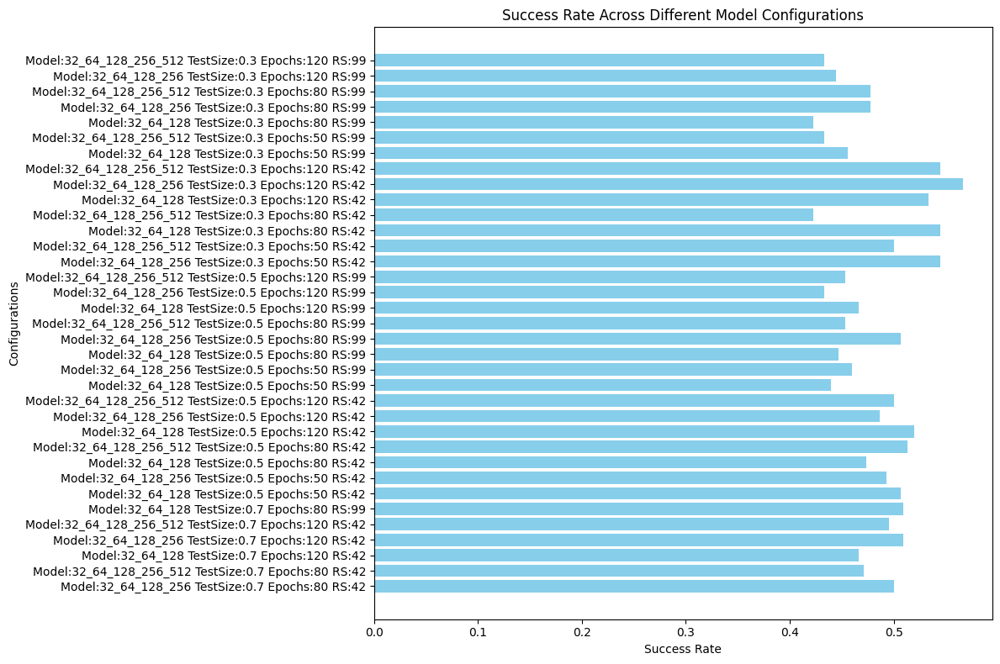

Epoch 1/120


C:\Users\Usuario\anaconda3\Lib\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


7/7 ━━━━━━━━━━━━━━━━━━━━ 7s 281ms/step - accuracy: 0.4639 - loss: 1.5348 - val_accuracy: 0.4889 - val_loss: 0.7239
Epoch 2/120
7/7 ━━━━━━━━━━━━━━━━━━━━ 2s 245ms/step - accuracy: 0.5023 - loss: 1.4107 - val_accuracy: 0.4889 - val_loss: 0.8209
Epoch 3/120
7/7 ━━━━━━━━━━━━━━━━━━━━ 2s 240ms/step - accuracy: 0.5538 - loss: 1.0507 - val_accuracy: 0.4889 - val_loss: 1.0596
Epoch 4/120
7/7 ━━━━━━━━━━━━━━━━━━━━ 2s 241ms/step - accuracy: 0.5733 - loss: 0.9541 - val_accuracy: 0.4889 - val_loss: 1.3424
Epoch 5/120
7/7 ━━━━━━━━━━━━━━━━━━━━ 2s 241ms/step - accuracy: 0.5968 - loss: 0.7709 - val_accuracy: 0.4889 - val_loss: 0.9956
Epoch 6/120
7/7 ━━━━━━━━━━━━━━━━━━━━ 2s 244ms/step - accuracy: 0.5026 - loss: 0.9336 - val_accuracy: 0.4889 - val_loss: 0.9999
Epoch 7/120
7/7 ━━━━━━━━━━━━━━━━━━━━ 2s 242ms/step - accuracy: 0.6119 - loss: 0.7806 - val_accuracy: 0.4889 - val_loss: 1.2783
Epoch 8/120
7/7 ━━━━━━━━━━━━━━━━━━━━ 2s 242ms/step - accuracy: 0.6451 - loss: 0.7692 - val_accuracy: 0.4889 - val_loss: 1.1

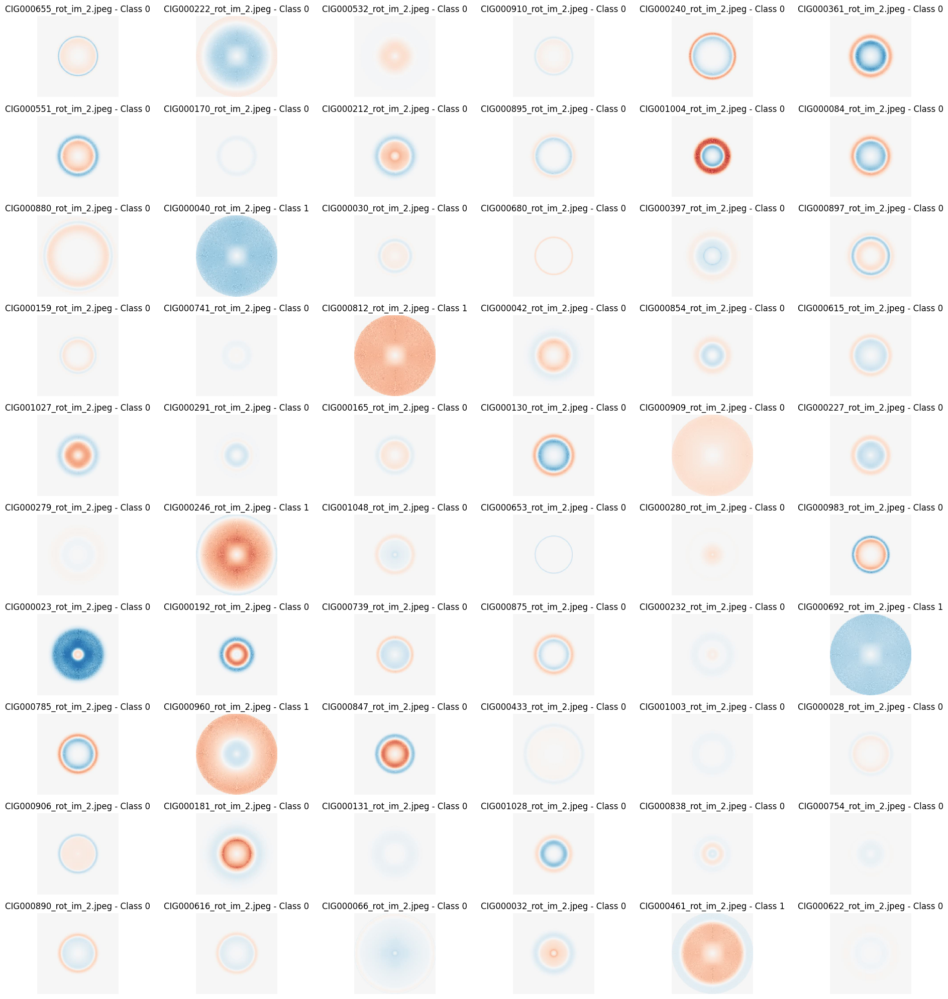

In [3]:
# 1.---------Importation of Libraries------
import os
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.artist import Artist, allow_rasterization
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout, BatchNormalization
from tensorflow.keras.preprocessing import image
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
import pandas as pd
from tensorflow.keras.optimizers import AdamW

# 2.---------Configuration Variables------
file_suffix = "_rot_im_2.jpeg"  #Selected 2D Image Model
directory = 'D:/1. JAE Intro ICU/CIG/ascii-files/sp_busyfit/rot_2D_im' # Select Output Directory
results_directory = os.path.join(directory, 'rot_2D_im2') # Select output file
num_groups = 2  #Selec Number of Groups to be Classified, related to "espada2011_table1"
espada2011_table1 = pd.read_csv(os.path.join(directory, 'Espada2011_Table1.csv'), delimiter=';') # Select Comparison Clasification

# 3.---------Image Loading Function------
def load_images(directory, file_suffix):
    images = []
    file_names = []
    for file in os.listdir(directory):
        if file.endswith(file_suffix):
            img_path = os.path.join(directory, file)
            img = image.load_img(img_path, target_size=(128, 128))
            img_array = image.img_to_array(img)
            images.append(img_array)
            file_names.append(file)
    images = np.array(images)
    return images, file_names

# 4.---------Image Preprocessing Function------
def preprocess_images(images):
    images = images / 255.0
    return images

# 5.---------Model Building Function------
def build_model(num_groups, layer_config):
    model = Sequential()
    model.add(Conv2D(layer_config[0], (3, 3), activation='relu', input_shape=(128, 128, 3)))
    model.add(BatchNormalization())
    model.add(MaxPooling2D((2, 2)))
    model.add(Dropout(0.25))
    
    for filters in layer_config[1:]:
        model.add(Conv2D(filters, (3, 3), activation='relu'))
        model.add(BatchNormalization())
        model.add(MaxPooling2D((2, 2)))
        model.add(Dropout(0.25))

    model.add(Flatten())
    model.add(Dense(512, activation='relu'))
    model.add(BatchNormalization())
    model.add(Dropout(0.5))
    model.add(Dense(num_groups, activation='softmax'))

    optimizer = AdamW(learning_rate=0.001, weight_decay=1e-5)
    model.compile(optimizer=optimizer, loss='sparse_categorical_crossentropy', metrics=['accuracy'])
    
    return model

# 6.---------Image Classification Function------
def classify_images(images, model):
    predictions = model.predict(images)
    predicted_classes = np.argmax(predictions, axis=1)
    return predicted_classes

# 7.---------Visualization Function------
def visualize_random_spectra(images, file_names, predicted_classes, num_samples=60):
    if num_samples > len(images):
        raise ValueError(f'The requested number of samples ({num_samples}) exceeds the test set size ({len(images)}).')
    
    # Ensure we don't exceed the maximum allowed subplots (10 rows * 6 columns = 60)
    num_samples = min(num_samples, 60)
    
    indices = np.random.choice(len(images), num_samples, replace=False)
    plt.figure(figsize=(20, 20))
    for i, idx in enumerate(indices):
        plt.subplot(10, 6, i + 1)
        plt.imshow(images[idx])
        plt.title(f'{file_names[idx]} - Class {predicted_classes[idx]}')
        plt.axis('off')
    plt.tight_layout()
    plt.show()

# 8.---------Label Assignment Function------
def assign_labels(num_samples, num_groups):
    labels = np.random.randint(0, num_groups, num_samples)
    return labels

# 9.---------Main Function (Execution of the Experiment)------
def main():
    os.makedirs(results_directory, exist_ok=True)  # Create the directory if it doesn't exist

    images, file_names = load_images(directory, file_suffix)
    images = preprocess_images(images)
    labels = assign_labels(len(images), num_groups)

    test_size_options = [0.7, 0.5, 0.3]
    random_state_options = [42, 99]
    epochs_options = [50, 80, 120]
    model_configs = [
        [32, 64, 128],      # Simple model
        [32, 64, 128, 256], # Medium model
        [32, 64, 128, 256, 512] # Complex model
    ]

    best_success_rate = 0
    best_model_config = None
    best_test_size = None
    best_random_state = None
    best_epochs = None

    success_rates = []  # List to store success rates for all combinations
    configurations = []  # List to store configuration details

    # 10.---------Hyperparameter Tuning Loop------
    for test_size in test_size_options:
        for random_state in random_state_options:
            for epochs in epochs_options:
                for model_config in model_configs:
                    X_train, X_test, y_train, y_test, file_names_train, file_names_test = train_test_split(
                        images, labels, file_names, test_size=test_size, random_state=random_state
                    )
                    
                    model = build_model(num_groups, model_config)
                    model.fit(X_train, y_train, epochs=epochs, validation_data=(X_test, y_test))

                    predicted_classes = classify_images(X_test, model)

                    model_config_str = '_'.join(map(str, model_config))
                    save_path = os.path.join(results_directory, f'classification_results_{model_config_str}_testsize{test_size}_epochs{epochs}_rs{random_state}.xlsx')
                    results_df = pd.DataFrame({'File Name': file_names_test, 'Class': predicted_classes})
                    results_df.to_excel(save_path, index=False)
                    print(f'Results saved to {os.path.abspath(save_path)}')

                    classification_results = results_df

                    classification_results['cig'] = classification_results['File Name'].str.extract(r'CIG(\d+)_')[0].astype(float)
                    classification_results = classification_results.dropna(subset=['cig'])
                    classification_results['cig'] = classification_results['cig'].astype(int)

                    merged_df = pd.merge(classification_results, espada2011_table1, on='cig', how='inner')
                    merged_df['coincidence'] = (merged_df['Class_x'] == merged_df['Class_y']).astype(int)

                    # Definir transformaciones basadas en el valor de num_groups
                    if num_groups == 2:
                        transformations = {
                            'Class_y_v1': lambda x: x,
                            'Class_y_v2': lambda x: x.map({0: 1, 1: 0}),
                        }
                    elif num_groups == 3:
                        transformations = {
                            'Class_y_v1': lambda x: x,
                            'Class_y_v2': lambda x: x.map({0: 1, 1: 2, 2: 0}),
                            'Class_y_v3': lambda x: x.map({0: 2, 1: 0, 2: 1}),
                            'Class_y_v4': lambda x: x.map({0: 0, 1: 2, 2: 1}),
                            'Class_y_v5': lambda x: x.map({0: 1, 1: 0, 2: 2}),
                            'Class_y_v6': lambda x: x.map({0: 2, 1: 1, 2: 0})
                        }
                    else:
                        raise ValueError("El valor de num_groups no es válido. Debe ser 2 o 3.")

                    results = []

                    # 11.---------Transformation and Success Rate Calculation------
                    for label, transform in transformations.items():
                        merged_df[label] = transform(merged_df['Class_y'])
                        coincidence_col = (merged_df['Class_x'] == merged_df[label]).astype(int)
                        success_rate = coincidence_col.mean()
                        # Check if all classes are the same
                        unique_classes = merged_df['Class_x'].nunique()
                        results.append({
                            'Transformation': label,
                            'Success Rate': success_rate,
                            'Total Matches': coincidence_col.sum(),
                            'Total Samples': len(merged_df),
                            'Unique Classes': unique_classes
                        })

                    results_df = pd.DataFrame(results)
                    # Exclude models where all samples are classified the same
                    filtered_results_df = results_df[results_df['Unique Classes'] > 1]

                    if not filtered_results_df.empty:
                        best_transformation = filtered_results_df.loc[filtered_results_df['Success Rate'].idxmax()]
                    else:
                        continue  # Skip if all classifications are the same

                    # Store the success rate and configuration for the final plot
                    success_rates.append(best_transformation['Success Rate'])
                    configurations.append(f'Model:{model_config_str} TestSize:{test_size} Epochs:{epochs} RS:{random_state}')

                    if best_transformation['Success Rate'] > best_success_rate:
                        best_success_rate = best_transformation['Success Rate']
                        best_model_config = model_config
                        best_test_size = test_size
                        best_random_state = random_state
                        best_epochs = epochs

                    results_save_path = os.path.join(results_directory, f'transformation_results_{model_config_str}_testsize{test_size}_epochs{epochs}_rs{random_state}.xlsx')
                    with pd.ExcelWriter(results_save_path) as writer:
                        filtered_results_df.to_excel(writer, sheet_name='Transformation_Summary', index=False)
                        merged_df.to_excel(writer, sheet_name='Merged_Data', index=False)

                    print(f'Results file saved at: {os.path.abspath(results_save_path)}')

    print(f"Best configuration: Model Config: {best_model_config}, Test Size: {best_test_size}, Random State: {best_random_state}, Epochs: {best_epochs}, Success Rate: {best_success_rate}")

    # 12.---------Plot of Success Rates Across All Configurations------
    plt.figure(figsize=(12, 8))
    plt.barh(configurations, success_rates, color='skyblue')
    plt.xlabel('Success Rate')
    plt.ylabel('Configurations')
    plt.title('Success Rate Across Different Model Configurations')
    plt.tight_layout()
    plot_image_path = os.path.join(results_directory, 'success_rate_across_configurations.jpeg')
    plt.savefig(plot_image_path, format='jpeg')
    plt.show()

    # 13.---------Visualization of Samples for the Best Configuration------
    X_train, X_test, y_train, y_test, file_names_train, file_names_test = train_test_split(
        images, labels, file_names, test_size=best_test_size, random_state=best_random_state
    )
    
    model = build_model(num_groups, best_model_config)
    model.fit(X_train, y_train, epochs=best_epochs, validation_data=(X_test, y_test))
    predicted_classes = classify_images(X_test, model)
    num_samples = min(300, len(X_test))
    visualize_random_spectra(X_test, file_names_test, predicted_classes, num_samples=num_samples)

if __name__ == "__main__":
    main()


### Step 4: Asymmetry Classification - Spectrums | CIG - AMIGA

---

In this part we performs automated data analysis focused on classifying and clustering ASCII-encoded images. It loads and preprocesses image data, applies multiple clustering methods (e.g., K-Means, DBSCAN) and classification algorithms (e.g., KNN, SVM, Random Forest), and evaluates their performance. The script also merges results with an external dataset to assess the accuracy of predictions, testing different configurations and transformations to find the optimal model. The results, including success rates and visualizations of random samples, are saved to Excel and plotted for further analysis.

In [ ]:
import os
import numpy as np
import pandas as pd
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans, SpectralClustering, DBSCAN, AgglomerativeClustering
from sklearn.mixture import GaussianMixture
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.ensemble import RandomForestClassifier
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from tslearn.shapelets import LearningShapelets

# 1.---------Variable Configuration------
file_suffix = ".asc"  # ASCII file extension
directory = 'D:/1. JAE Intro ICU/CIG/ascii-files'
results_directory = os.path.join(directory, 'results_Shapelets_TDE5_3')  # Results directory
num_groups = 3  # Number of groups for classification
espada2011_table1 = pd.read_csv(os.path.join(directory, 'sp_busyfit/rot_im_busyfit_3/Espada2011_Table1_5.csv'), delimiter=';')

# 2.---------Function to Load ASCII Files------
def load_fits_data(directory, file_suffix):
    images = []
    file_names = []
    for file in os.listdir(directory):
        if file.endswith(file_suffix):
            file_path = os.path.join(directory, file)
            try:
                data = np.loadtxt(file_path)
                if data.ndim == 2:  # Check if data has 2 dimensions
                    images.append(data.flatten())  # Flatten data to 1D
                    file_names.append(file)
            except Exception as e:
                print(f"Error loading {file}: {e}")
    return images, file_names

# 3.---------Function for Preprocessing Files------
def preprocess_images(images, target_length=None):
    if target_length is None:
        target_length = max(len(image) for image in images)
    
    scaler = StandardScaler()
    images_scaled = []
    for image in images:
        image = np.pad(image, (0, max(0, target_length - len(image))), 'constant')[:target_length]
        image_scaled = scaler.fit_transform(image.reshape(-1, 1)).flatten()
        images_scaled.append(image_scaled)
    
    return images_scaled

# 4.---------Function for Visualization------
def visualize_random_spectra(images, file_names, predicted_classes, num_samples=60):
    if num_samples > len(images):
        raise ValueError(f'The requested number of samples ({num_samples}) exceeds the test set size ({len(images)}).')
    
    num_samples = min(num_samples, 60)
    
    indices = np.random.choice(len(images), num_samples, replace=False)
    plt.figure(figsize=(20, 20))
    for i, idx in enumerate(indices):
        plt.subplot(10, 6, i + 1)
        plt.plot(images[idx])  # Visualize as spectrum
        plt.title(f'{file_names[idx]} - Class {predicted_classes[idx]}')
        plt.axis('off')
    plt.tight_layout()
    plt.show()

# 5.---------Function to Assign Labels------
def assign_labels(num_samples, num_groups):
    labels = np.random.randint(0, num_groups, num_samples)
    return labels

# 6.---------Function to Apply Clustering and Classification Models------
def apply_clustering(images, method):
    if method == 'kmeans':
        model = KMeans(n_clusters=num_groups, random_state=42)
    elif method == 'spectral':
        model = SpectralClustering(n_clusters=num_groups, random_state=42)
    elif method == 'dbscan':
        model = DBSCAN(eps=0.5, min_samples=5)
    elif method == 'agglomerative':
        model = AgglomerativeClustering(n_clusters=num_groups)
    elif method == 'gaussian_mixture':
        model = GaussianMixture(n_components=num_groups, random_state=42)
    
    predicted_classes = model.fit_predict(images)
    
    return predicted_classes

def apply_classification(X_train, y_train, X_test, method):
    if method == 'knn':
        model = KNeighborsClassifier(n_neighbors=5)
    elif method == 'svm':
        model = SVC(kernel='linear', probability=True)
    elif method == 'random_forest':
        model = RandomForestClassifier(n_estimators=100, random_state=42)
    elif method == 'shapelets':
        model = LearningShapelets(n_shapelets_per_size={100: 10, 50: 8, 30: 5, 10: 3}, max_iter=350, batch_size=10, scale=True)
    
    model.fit(X_train, y_train)
    predicted_classes = model.predict(X_test)
    
    return predicted_classes

# 7.---------Main Function (Experiment Execution)------
def main():
    os.makedirs(results_directory, exist_ok=True)  # Create directory if it doesn't exist

    images, file_names = load_fits_data(directory, file_suffix)
    images = preprocess_images(images)
    labels = assign_labels(len(images), num_groups)

    test_size_options = [0.7, 0.5, 0.3]
    random_state_options = [42, 99]
    methods = ['kmeans', 'spectral', 'dbscan', 'agglomerative', 'gaussian_mixture', 'knn', 'svm', 'random_forest', 'shapelets']

    best_success_rate = 0
    best_method = None
    best_test_size = None
    best_random_state = None

    success_rates = []
    configurations = []

    for test_size in test_size_options:
        for random_state in random_state_options:
            for method in methods:
                X_train, X_test, y_train, y_test, file_names_train, file_names_test = train_test_split(
                    images, labels, file_names, test_size=test_size, random_state=random_state
                )

                if method in ['kmeans', 'spectral', 'dbscan', 'agglomerative', 'gaussian_mixture']:
                    predicted_classes = apply_clustering(X_test, method)
                else:
                    predicted_classes = apply_classification(X_train, y_train, X_test, method)

                results_df = pd.DataFrame({'File Name': file_names_test, 'Class': predicted_classes})
                save_path = os.path.join(results_directory, f'classification_results_{method}_testsize{test_size}_rs{random_state}.xlsx')
                results_df.to_excel(save_path, index=False)
                print(f'Results saved to {os.path.abspath(save_path)}')

                classification_results = results_df
                classification_results['cig'] = classification_results['File Name'].str.extract(r'CIG(\d+)_')[0].astype(float)
                classification_results = classification_results.dropna(subset=['cig'])
                classification_results['cig'] = classification_results['cig'].astype(int)

                merged_df = pd.merge(classification_results, espada2011_table1, on='cig', how='inner')
                merged_df['coincidence'] = (merged_df['Class_x'] == merged_df['Class_y']).astype(int)

                transformations = {
                    'Class_y_v1': lambda x: x,
                    'Class_y_v2': lambda x: x.map({0: 1, 1: 2, 2: 0}),
                    'Class_y_v3': lambda x: x.map({0: 2, 1: 0, 2: 1}),
                    'Class_y_v4': lambda x: x.map({0: 0, 1: 2, 2: 1}),
                    'Class_y_v5': lambda x: x.map({0: 1, 1: 0, 2: 2}),
                    'Class_y_v6': lambda x: x.map({0: 2, 1: 1, 2: 0})
                }

                results = []

                for label, transform in transformations.items():
                    merged_df[label] = transform(merged_df['Class_y'])
                    coincidence_col = (merged_df['Class_x'] == merged_df[label]).astype(int)
                    success_rate = coincidence_col.mean()
                    results.append({
                        'Transformation': label,
                        'Success Rate': success_rate,
                        'Total Matches': coincidence_col.sum(),
                        'Total Samples': len(merged_df)
                    })

                results_df = pd.DataFrame(results)
                best_transformation = results_df.loc[results_df['Success Rate'].idxmax()]

                success_rates.append(best_transformation['Success Rate'])
                configurations.append(f'Method:{method} TestSize:{test_size} RS:{random_state}')

                if best_transformation['Success Rate'] > best_success_rate:
                    best_success_rate = best_transformation['Success Rate']
                    best_method = method
                    best_test_size = test_size
                    best_random_state = random_state

                results_save_path = os.path.join(results_directory, f'transformation_results_{method}_testsize{test_size}_rs{random_state}.xlsx')
                with pd.ExcelWriter(results_save_path) as writer:
                    results_df.to_excel(writer, sheet_name='Transformation_Summary', index=False)
                    merged_df.to_excel(writer, sheet_name='Merged_Data', index=False)

                print(f'Results file saved at: {os.path.abspath(results_save_path)}')

    print(f"Best configuration: Method: {best_method}, Test Size: {best_test_size}, Random State: {best_random_state}, Success Rate: {best_success_rate}")

    plt.figure(figsize=(12, 8))
    plt.barh(configurations, success_rates, color='skyblue')
    plt.xlabel('Success Rate')
    plt.ylabel('Configurations')
    plt.title('Success Rate Across Different Configurations')
    plt.tight_layout()
    plot_image_path = os.path.join(results_directory, 'success_rate_across_configurations.jpeg')
    plt.savefig(plot_image_path, format='jpeg')
    plt.show()

    X_train, X_test, y_train, y_test, file_names_train, file_names_test = train_test_split(
        images, labels, file_names, test_size=best_test_size, random_state=best_random_state
    )
    
    predicted_classes = apply_classification(X_train, y_train, X_test, best_method)
    visualize_random_spectra(X_test, file_names_test, predicted_classes, num_samples=min(300, len(X_test)))

if __name__ == "__main__":
    main()
